!pip install snscrape

# Scrapping posts twitter tag sustainability + fashion depuis 2014 avec au moins 5 likes

In [ ]:
import snscrape.modules.twitter as sntwitter
import pandas as pd
import re

query = "#sustainability #fashion since:2014 min_faves:5"

tweets = []
limit = None  # set to None to get all tweets

for tweet in sntwitter.TwitterSearchScraper(query).get_items():
    if limit and len(tweets) == limit:
        break
    else:
        # Extract hashtags from tweet content
        hashtags = re.findall(r'\#\w+', tweet.content)
        hashtags = [h.strip('#') for h in hashtags]  # remove '#' symbol
        
        # Calculate number of shares
        shares = tweet.retweetCount + tweet.quoteCount
        
        # Extract date (without hour) from tweet date
        date = tweet.date.date().strftime('%Y-%m-%d')
        
        tweets.append([date, tweet.username, tweet.user.followersCount, tweet.content, tweet.likeCount, shares, hashtags])
        
df = pd.DataFrame(tweets, columns=['Date', 'User', 'Followers', 'Tweet', 'Likes', 'Shares', 'Hashtags'])
df.head(10)

# to save to csv
df.to_csv('tweets1.csv')


In [ ]:
import snscrape.modules.twitter as sntwitter
import pandas as pd
import re

query = "#sustainability #fashion since:2013-01-01 until:2017-12-31 min_faves:5"

tweets = []
limit = None  # set to None to get all tweets

for tweet in sntwitter.TwitterSearchScraper(query).get_items():
    if limit and len(tweets) == limit:
        break
    else:
        # Extract hashtags from tweet content
        hashtags = re.findall(r'\#\w+', tweet.content)
        hashtags = [h.strip('#') for h in hashtags]  # remove '#' symbol
        
        # Calculate number of shares
        shares = tweet.retweetCount + tweet.quoteCount
        
        # Extract date (without hour) from tweet date
        date = tweet.date.date().strftime('%Y-%m-%d')
        
        tweets.append([date, tweet.username, tweet.user.followersCount, tweet.content, tweet.likeCount, shares, hashtags])
        
df = pd.DataFrame(tweets, columns=['Date', 'User', 'Followers', 'Tweet', 'Likes', 'Shares', 'Hashtags'])
df.head(10)

# to save to csv
df.to_csv('tweets2.csv')


In [ ]:
import snscrape.modules.twitter as sntwitter
import pandas as pd
import re

query = "#sustainability #fashion since:2012-01-01 until:2013-12-31 min_faves:5"

tweets = []
limit = None  # set to None to get all tweets

for tweet in sntwitter.TwitterSearchScraper(query).get_items():
    if limit and len(tweets) == limit:
        break
    else:
        # Extract hashtags from tweet content
        hashtags = re.findall(r'\#\w+', tweet.content)
        hashtags = [h.strip('#') for h in hashtags]  # remove '#' symbol
        
        # Calculate number of shares
        shares = tweet.retweetCount + tweet.quoteCount
        
        # Extract date (without hour) from tweet date
        date = tweet.date.date().strftime('%Y-%m-%d')
        
        tweets.append([date, tweet.username, tweet.user.followersCount, tweet.content, tweet.likeCount, shares, hashtags])
        
df = pd.DataFrame(tweets, columns=['Date', 'User', 'Followers', 'Tweet', 'Likes', 'Shares', 'Hashtags'])
df.head(10)

# to save to csv
df.to_csv('tweets3.csv')


# Scrapping posts twitter tag sustainability depuis 2014 avec au moins 5 likes

In [ ]:
        
import snscrape.modules.twitter as sntwitter
import pandas as pd
import re

query = "#sustainability since:2014-01-01 until:2023-12-31 min_faves:5"

tweets = []
limit = None  # set to None to get all tweets

for tweet in sntwitter.TwitterSearchScraper(query).get_items():
    if limit and len(tweets) == limit:
        break
    else:
        # Extract hashtags from tweet content
        hashtags = re.findall(r'\#\w+', tweet.content)
        hashtags = [h.strip('#') for h in hashtags]  # remove '#' symbol
        
        # Calculate number of shares
        shares = tweet.retweetCount + tweet.quoteCount
        
        # Extract date (without hour) from tweet date
        date = tweet.date.date().strftime('%Y-%m-%d')
        
        tweets.append([date, tweet.username, tweet.user.followersCount, tweet.content, tweet.likeCount, shares, hashtags])
        
df = pd.DataFrame(tweets, columns=['Date', 'User', 'Followers', 'Tweet', 'Likes', 'Shares', 'Hashtags'])
df.head(10)

# to save to csv
df.to_csv('tweets_all.csv')


# Scrapping posts twitter tag fashion depuis 2014 avec au moins 100 likes

In [ ]:
        
import snscrape.modules.twitter as sntwitter
import pandas as pd
import re

query = "#fashion since:2014-01-01 until:2023-12-31 min_faves:100"

tweets = []
limit = 100000  # set to None to get all tweets

for tweet in sntwitter.TwitterSearchScraper(query).get_items():
    if limit and len(tweets) == limit:
        break
    else:
        # Extract hashtags from tweet content
        hashtags = re.findall(r'\#\w+', tweet.content)
        hashtags = [h.strip('#') for h in hashtags]  # remove '#' symbol
        
        # Calculate number of shares
        shares = tweet.retweetCount + tweet.quoteCount
        
        # Extract date (without hour) from tweet date
        date = tweet.date.date().strftime('%Y-%m-%d')
        
        tweets.append([date, tweet.username, tweet.user.followersCount, tweet.content, tweet.likeCount, shares, hashtags])
        
df = pd.DataFrame(tweets, columns=['Date', 'User', 'Followers', 'Tweet', 'Likes', 'Shares', 'Hashtags'])
df.head(10)

# to save to csv
df.to_csv('tweets_all_fashion.csv')


# Alimentation base de données SQL

In [16]:
import csv
import pyodbc

# Connection details
server = 'localhost'
database = 'Sales'
driver = '{ODBC Driver 17 for SQL Server}'

# Create a connection object using Windows authentication
conn_str = 'DRIVER=' + driver + ';SERVER=' + server + ';DATABASE=' + database + ';Trusted_Connection=yes;'
conn = pyodbc.connect(conn_str)

try:
    # Create a cursor object
    cursor = conn.cursor()

    # Read the CSV file
    with open('tweets1.csv', 'r', encoding='utf-8') as csvfile:
        reader = csv.reader(csvfile)
        next(reader) # Skip the header row
        for row in reader:
            # Insert a row into the t1 table
            cursor.execute("INSERT INTO t1 (Date, [User], Followers, Tweet, Likes, Shares, Hashtags) VALUES (?, ?, ?, ?, ?, ?, ?)", row[1:])

        conn.commit()
        print(f"Inserted {cursor.rowcount} rows into the t1 table.")
except Exception as e:
    print(e)
finally:
    conn.close()
    print('Done')


Inserted 1 rows into the t1 table.
Done


In [14]:
import csv
import pyodbc

# Connection details
server = 'localhost'
database = 'Sales'
driver = '{ODBC Driver 17 for SQL Server}'

# Create a connection object using Windows authentication
conn_str = 'DRIVER=' + driver + ';SERVER=' + server + ';DATABASE=' + database + ';Trusted_Connection=yes;'
conn = pyodbc.connect(conn_str)

try:
    # Create a cursor object
    cursor = conn.cursor()

    # Read the CSV file
    with open('tweets2.csv', 'r', encoding='utf-8') as csvfile:
        reader = csv.reader(csvfile)
        next(reader) # Skip the header row
        for row in reader:
            # Insert a row into the t1 table
            cursor.execute("INSERT INTO t1 (Date, [User], Followers, Tweet, Likes, Shares, Hashtags) VALUES (?, ?, ?, ?, ?, ?, ?)", row[1:])

        conn.commit()
        print(f"Inserted {cursor.rowcount} rows into the t1 table.")
except Exception as e:
    print(e)
finally:
    conn.close()
    print('Done')


Inserted 1 rows into the t1 table.
Done


In [ ]:
from datetime import datetime, timedelta
import snscrape.modules.twitter as sntwitter
import pandas as pd
import re

# Get current date
today = datetime.now()

# Subtract 7 days from today to get the since date
since_date = today - timedelta(days=7)

# Format since date as yyyy-mm-dd string
since_str = since_date.strftime('%Y-%m-%d')

# Construct query string with since date
query = f"#fashion since:{since_str} until:2023-12-31 min_faves:5"

tweets = []
limit = None  # set to None to get all tweets

for tweet in sntwitter.TwitterSearchScraper(query).get_items():
    if limit and len(tweets) == limit:
        break
    else:
        # Extract hashtags from tweet content
        hashtags = re.findall(r'\#\w+', tweet.content)
        hashtags = [h.strip('#') for h in hashtags]  # remove '#' symbol
        
        # Calculate number of shares
        shares = tweet.retweetCount + tweet.quoteCount
        
        # Extract date (without hour) from tweet date
        date = tweet.date.date().strftime('%Y-%m-%d')
        
        tweets.append([date, tweet.username, tweet.user.followersCount, tweet.content, tweet.likeCount, shares, hashtags])
        
df = pd.DataFrame(tweets, columns=['Date', 'User', 'Followers', 'Tweet', 'Likes', 'Shares', 'Hashtags'])
df.head(10)

# to save to csv
df.to_csv('tweets3.csv')

In [ ]:
import csv
import pyodbc

# Connection details
server = 'localhost'
database = 'Sales'
driver = '{ODBC Driver 17 for SQL Server}'

# Create a connection object using Windows authentication
conn_str = 'DRIVER=' + driver + ';SERVER=' + server + ';DATABASE=' + database + ';Trusted_Connection=yes;'
conn = pyodbc.connect(conn_str)

try:
    # Create a cursor object
    cursor = conn.cursor()

    # Read the CSV file
    with open('tweets3.csv', 'r', encoding='utf-8') as csvfile:
        reader = csv.reader(csvfile)
        next(reader) # Skip the header row
        for row in reader:
            # Insert a row into the t1 table
            cursor.execute("INSERT INTO t1 (Date, [User], Followers, Tweet, Likes, Shares, Hashtags) VALUES (?, ?, ?, ?, ?, ?, ?)", row[1:])

        conn.commit()
        print(f"Inserted {cursor.rowcount} rows into the t1 table.")
except Exception as e:
    print(e)
finally:
    conn.close()
    print('Done')


# Analyse trend fashion + sustainability

In [26]:
import pyodbc
import pandas as pd

server = 'localhost'
database = 'Sales'
driver = '{ODBC Driver 17 for SQL Server}'

# Create a connection object using Windows authentication
conn_str = 'DRIVER=' + driver + ';SERVER=' + server + ';DATABASE=' + database + ';Trusted_Connection=yes;'
conn = pyodbc.connect(conn_str)

try:
    # Create a cursor object
    cursor = conn.cursor()

    # Execute the query and fetch the data
    cursor.execute('SELECT * FROM t1 ORDER BY Date DESC')
    data = cursor.fetchall()


    # Read the data into a pandas dataframe
    df = pd.read_sql('SELECT * FROM t1 ORDER BY Date DESC', conn)
    

except Exception as e:
    print(e)

finally:
    # Close the connection
    conn.close()
df.head()

C:\Users\solen\anaconda3\lib\site-packages\pandas\io\sql.py:762: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


,Date,User,Followers,Tweet,Likes,Shares,Hashtags
0,2023-04-13,AveryDennison,149014,Join #sustainable #fashion expert Debbie Shake...,6,0,"['sustainable', 'fashion', 'sustainability']"
1,2023-04-12,choosiishirlii,484,Hey #nftcolllectors! In town for #NFTNYC? Join...,7,5,"['nftcolllectors', 'NFTNYC', 'cryptoart', 'sus..."
2,2023-04-11,annkozma723,28312,See you soon! ????????????? \n\nLIVE at 12pm P...,6,1,"['ecoactivism', 'sustainability', 'fashion']"
3,2023-04-10,AfricanCaribbe2,422,The #covid19 inspired us to think #sustainabil...,10,4,"['covid19', 'sustainability', 'fashion', 'Afri..."
4,2023-04-07,TysonLester,90554,Louis Vuitton— European luxury #Fashion brands...,14,4,"['Fashion', 'Metaverse', 'Brand', 'Sustainabil..."


In [1117]:
import pandas as pd

# Lecture des fichiers CSV
tweets1 = pd.read_csv('tweets1.csv')
tweets2 = pd.read_csv('tweets2.csv')
tweets3 = pd.read_csv('tweets3.csv')

# Concaténation des dataframes
df = pd.concat([tweets1, tweets2, tweets3])
df = df.drop('Unnamed: 0', axis=1)
# Affichage du dataframe combiné
df.head()


,Date,User,Followers,Tweet,Likes,Shares,Hashtags
0,2023-04-13,AveryDennison,149014,Join #sustainable #fashion expert Debbie Shake...,6,0,"['sustainable', 'fashion', 'sustainability']"
1,2023-04-12,choosiishirlii,484,Hey #nftcolllectors! In town for #NFTNYC? Join...,7,5,"['nftcolllectors', 'NFTNYC', 'cryptoart', 'sus..."
2,2023-04-11,annkozma723,28312,See you soon! 🕛💕🗺️♻️🧵🪡 \n\nLIVE at 12pm Pacifi...,6,1,"['ecoactivism', 'sustainability', 'fashion']"
3,2023-04-10,AfricanCaribbe2,422,The #covid19 inspired us to think #sustainabil...,10,4,"['covid19', 'sustainability', 'fashion', 'Afri..."
4,2023-04-07,TysonLester,90554,Louis Vuitton— European luxury #Fashion brands...,14,4,"['Fashion', 'Metaverse', 'Brand', 'Sustainabil..."


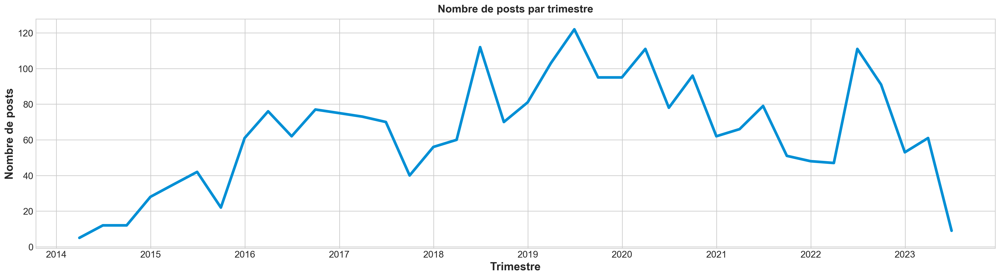

In [1118]:
import matplotlib.pyplot as plt

# Création d'une colonne pour le trimestre
# Convertir la colonne 'Date' en format de date pandas
df['Date'] = pd.to_datetime(df['Date'])
# Création d'une colonne pour le mois
df['Month'] = df['Date'].dt.strftime('%Y-%m')

df['Quarter'] = df['Date'].dt.to_period('Q')

# Comptage des occurrences de chaque trimestre
quarterly_counts = df.resample('Q', on='Date').size().reset_index(name='Count')

# Tracé d'un graphique de comptage trimestriel
plt.figure(figsize=(21, 6))
plt.plot(quarterly_counts['Date'], quarterly_counts['Count'])
plt.xlabel('Trimestre')
plt.ylabel('Nombre de posts')
plt.title('Nombre de posts par trimestre')
plt.show()

In [1119]:
quarterly_counts = df.resample('3M', on='Date').size().reset_index(name='Count')
quarterly_counts.set_index('Date', inplace=True)
quarterly_counts.head(3)

,Count
Date,
2014-02-28,2
2014-05-31,12
2014-08-31,8


<Figure size 1100x600 with 0 Axes>

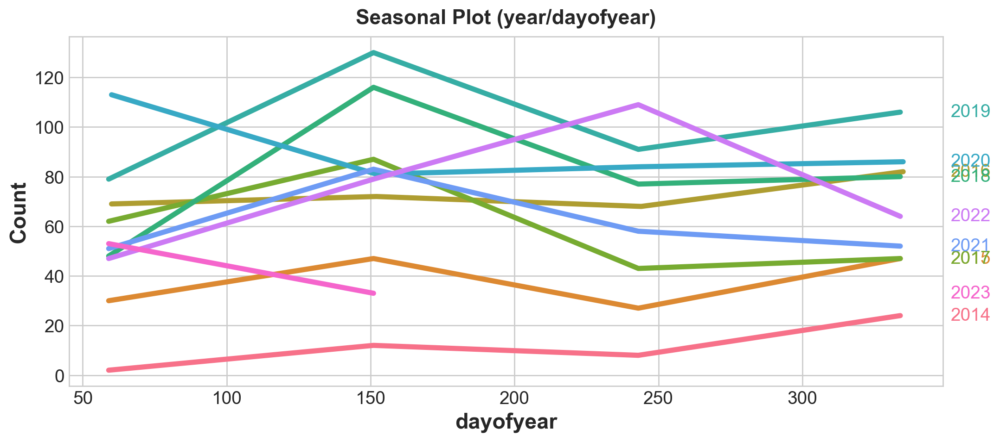

In [1121]:

data= quarterly_counts
X = data.copy()
X.index = pd.to_datetime(data.index)

# days within a week
X["week"] = X.index.week  # the seasonal period (period)
X = data.copy()
X.index = pd.to_datetime(data.index)
# days within a week
X["day"] = X.index.dayofweek  # the x-axis (freq)
X["week"] = X.index.week  # the seasonal period (period)
X["month"] = X.index.month  # the seasonal period (period)
# days within a year
X["dayofyear"] = X.index.dayofyear
X["year"] = X.index.year
fig = plt.figure(figsize=(11, 6))
seasonal_plot(X, y="Count", period="year", freq="dayofyear", ax=None)
plt.show()

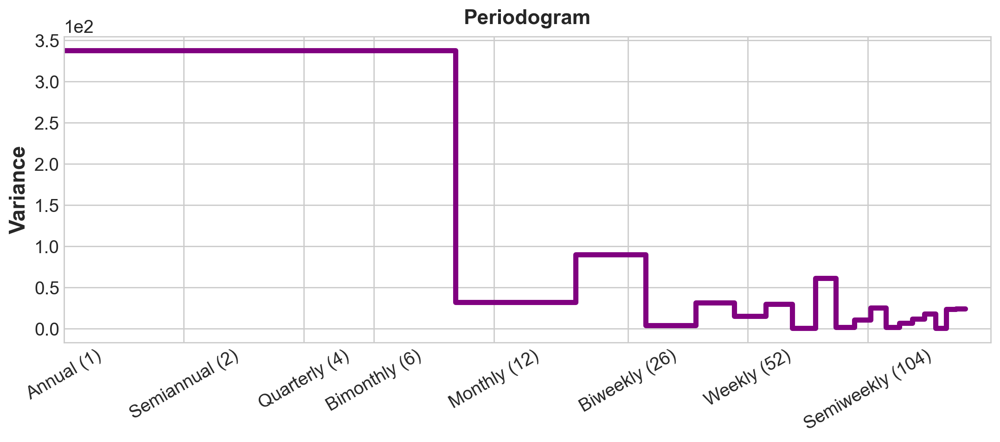

In [1123]:
plot_periodogram(X.Count);

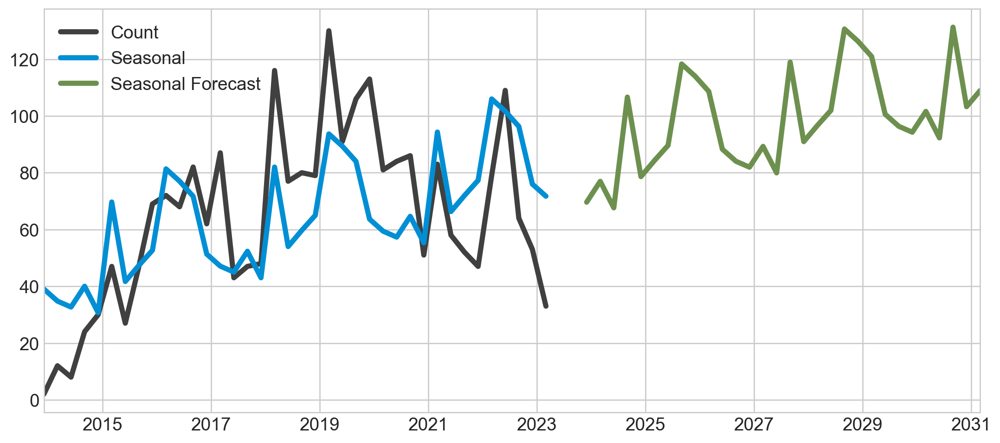

In [1128]:
from statsmodels.tsa.deterministic import CalendarSeasonality, CalendarFourier, DeterministicProcess

index = pd.PeriodIndex(X.index, freq='3M')
X.index = index

seasonality = CalendarSeasonality(freq='M', period='A')  # weekly seasonality
fourier = CalendarFourier(freq="M", order=20)  # 2 sin/cos pairs for "A"nnual seasonality

dp = DeterministicProcess(
    index=X.index,
    constant=True,               # dummy feature for bias (y-intercept)
    order=1,                     # trend (order 1 means linear)
    seasonal=True,               # weekly seasonality (indicators)
    additional_terms=[seasonality, fourier],  # annual seasonality (fourier)
    drop=True,                   # drop terms to avoid collinearity
)

X = dp.in_sample()  # create features for dates in tunnel.index
y = data.Count
model = LinearRegression(fit_intercept=False)
_ = model.fit(X, y)

y_pred = pd.Series(model.predict(X), index=y.index)
X_fore = dp.out_of_sample(steps=30)

y_fore = pd.Series(model.predict(X_fore), index=X_fore.index)

ax = y.plot(color='0.25', style='.', title="Lace restock - Seasonal Forecast")
ax = y_pred.plot(ax=ax, label="Seasonal")
ax = y_fore.plot(ax=ax, label="Seasonal Forecast", color='C3')
_ = ax.legend()


Nous pouvons observer une augmentation considérable depuis 2014, il y a une baisse entre fin 2017 et début 2018 mais l'association a grimpé mi 2018 pour atteindre son sommet mi-2019. Ensuite du au Covid, cette tendance a baissé. Une reprise est observé en 2022.Mais une augmentation peut être envisagé dans les années à venir. 

In [1129]:
# Replace 'fashion' with 'Fashion' and 'sustainability' with 'Sustainability' in the Hashtags column
df['Hashtags'] = df['Hashtags'].str.replace('fashion', 'Fashion').str.replace('sustainability', 'Sustainability')

# Create a new column with the list of hashtags
df['Hashtags_list'] = df['Hashtags'].apply(lambda x: eval(x))

# Flatten the list of hashtags and count their occurrences
hashtag_counts = df['Hashtags_list'].explode().value_counts()

# Print the number of unique hashtags and their counts
print("Number of unique hashtags:", len(hashtag_counts))
print("\nHashtag counts:")
hashtag_counts.head(20)


Number of unique hashtags: 3440

Hashtag counts:


Fashion               2457
Sustainability        2450
sustainableFashion     235
innovation             172
circulareconomy        133
iKLEID                 116
future                 109
sustainable            102
Fashiontech             90
design                  82
environment             79
ethicalFashion          75
FashionTech             67
ecoFashion              55
business                53
tech                    53
ecofriendly             52
fastFashion             52
SDGs                    51
textiles                49
Name: Hashtags_list, dtype: int64

In [1130]:
# Replace 'fashion' with 'Fashion' and 'sustainability' with 'Sustainability' in the Hashtags column
df['Hashtags'] = df['Hashtags'].str.replace('fashion', 'Fashion').str.replace('sustainability', 'Sustainability')

# Create separate columns for each hashtag
df['Hashtag_sustainable'] = df['Hashtags'].apply(lambda x: 1 if 'Sustainability' in x else 0)
df['Hashtag_Fashion'] = df['Hashtags'].apply(lambda x: 1 if 'Fashion' in x else 0)
df['Hashtag_sustainablefashion'] = df['Hashtags'].apply(lambda x: 1 if 'sustainablefashion' in x else 0)
df['Hashtag_innovation'] = df['Hashtags'].apply(lambda x: 1 if 'innovation' in x else 0)
df['Hashtag_circulareconomy'] = df['Hashtags'].apply(lambda x: 1 if 'circulareconomy' in x else 0)
df['Hashtag_iKLEID'] = df['Hashtags'].apply(lambda x: 1 if 'iKLEID' in x else 0)
df['Hashtag_future'] = df['Hashtags'].apply(lambda x: 1 if 'future' in x else 0)
df['Hashtag_fashiontech'] = df['Hashtags'].apply(lambda x: 1 if 'fashiontech' in x else 0)
df['Hashtag_design'] = df['Hashtags'].apply(lambda x: 1 if 'design' in x else 0)
df['Hashtag_environment'] = df['Hashtags'].apply(lambda x: 1 if 'environment' in x else 0)
df['Hashtag_ethicalfashion'] = df['Hashtags'].apply(lambda x: 1 if 'ethicalfashion' in x else 0)
df['Hashtag_ecofashion'] = df['Hashtags'].apply(lambda x: 1 if 'ecofashion' in x else 0)
df['Hashtag_tech'] = df['Hashtags'].apply(lambda x: 1 if 'tech' in x else 0)
df['Hashtag_business'] = df['Hashtags'].apply(lambda x: 1 if 'business' in x else 0)
df['Hashtag_ecofriendly'] = df['Hashtags'].apply(lambda x: 1 if 'ecofriendly' in x else 0)
df['Hashtag_fastfashion'] = df['Hashtags'].apply(lambda x: 1 if 'fastfashion' in x else 0)
df['Hashtag_textiles'] = df['Hashtags'].apply(lambda x: 1 if 'textiles' in x else 0)

# Drop the original Hashtags column
df.drop('Hashtags', axis=1, inplace=True)


In [1131]:
df.columns

Index(['Date', 'User', 'Followers', 'Tweet', 'Likes', 'Shares', 'Month',
       'Quarter', 'Hashtags_list', 'Hashtag_sustainable', 'Hashtag_Fashion',
       'Hashtag_sustainablefashion', 'Hashtag_innovation',
       'Hashtag_circulareconomy', 'Hashtag_iKLEID', 'Hashtag_future',
       'Hashtag_fashiontech', 'Hashtag_design', 'Hashtag_environment',
       'Hashtag_ethicalfashion', 'Hashtag_ecofashion', 'Hashtag_tech',
       'Hashtag_business', 'Hashtag_ecofriendly', 'Hashtag_fastfashion',
       'Hashtag_textiles'],
      dtype='object')

In [1143]:
df_plot = df.groupby('Date')[['Hashtag_sustainable', 'Hashtag_innovation', 'Hashtag_environment', 'Hashtag_textiles', 'Hashtag_business', 'Hashtag_design','Hashtag_future','Hashtag_circulareconomy']].sum().reset_index()
df_plot['Date'] = pd.to_datetime(df_plot['Date'])
df_plot.set_index('Date', inplace=True)
df_plot = df_plot.resample('3M').sum()
df_plot['Date']=df_plot.index
df_plot.head(3)

,Hashtag_sustainable,Hashtag_innovation,Hashtag_environment,Hashtag_textiles,Hashtag_business,Hashtag_design,Hashtag_future,Hashtag_circulareconomy,Date
Date,,,,,,,,,
2014-02-28,2,0,0,0,0,0,0,0,2014-02-28
2014-05-31,12,0,0,0,0,0,0,0,2014-05-31
2014-08-31,8,2,0,0,0,0,0,0,2014-08-31


<AxesSubplot:>

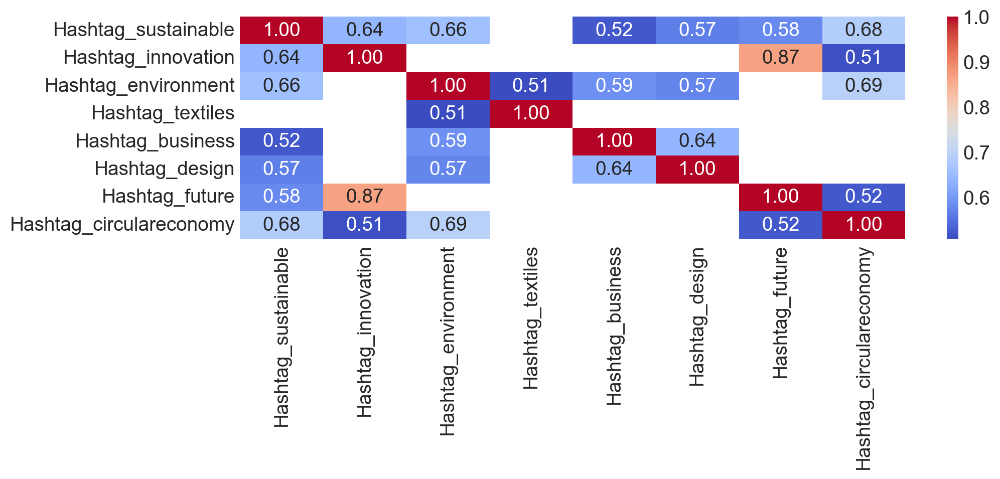

In [1145]:
corr = df_plot.corr()

# 使用颜色地图显示相关系数
mask = corr.abs() < 0.5
sns.heatmap(corr, cmap='coolwarm', annot=True, fmt='.2f', mask=mask)


Nous pouvons voir que sustainability a une correlation assez importante(>0.6) avec innovation, environnement, business, design, future et circulareconomy. Ce sont tous les sujets que nous pouvons intégrer dans le future discours pour encourager une façon plus responsable de consommer dans le secteur de fast fashion 

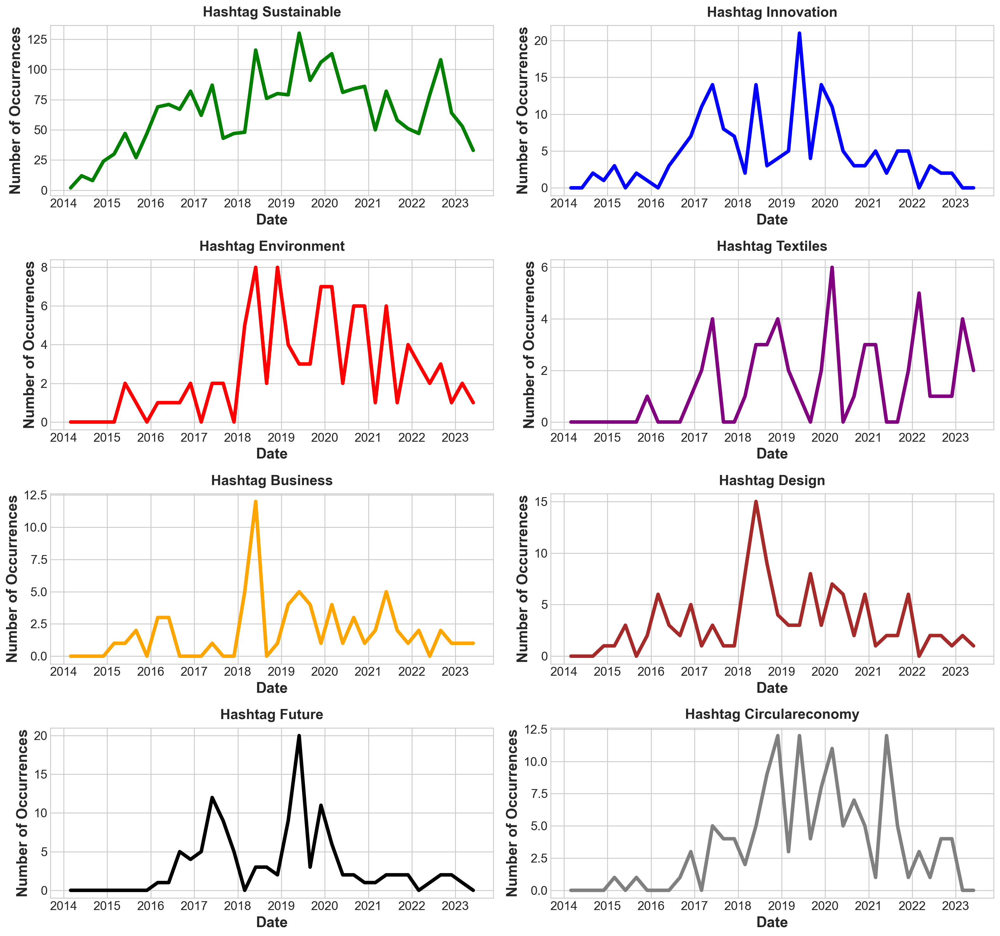

In [1136]:
import matplotlib.pyplot as plt

# 创建一个新的画布
fig, axs = plt.subplots(4, 2, figsize=(16, 15))

# 绘制第一个 Hashtag 的折线图
axs[0, 0].plot(df_plot['Date'], df_plot['Hashtag_sustainable'], color='green')
axs[0, 0].set_title('Hashtag Sustainable')
axs[0, 0].set_xlabel('Date')
axs[0, 0].set_ylabel('Number of Occurrences')
axs[0, 0].grid(True)

# 绘制第二个 Hashtag 的折线图
axs[0, 1].plot(df_plot['Date'], df_plot['Hashtag_innovation'], color='blue')
axs[0, 1].set_title('Hashtag Innovation')
axs[0, 1].set_xlabel('Date')
axs[0, 1].set_ylabel('Number of Occurrences')
axs[0, 1].grid(True)

# 绘制第三个 Hashtag 的折线图
axs[1, 0].plot(df_plot['Date'], df_plot['Hashtag_environment'], color='red')
axs[1, 0].set_title('Hashtag Environment')
axs[1, 0].set_xlabel('Date')
axs[1, 0].set_ylabel('Number of Occurrences')
axs[1, 0].grid(True)

# 绘制第四个 Hashtag 的折线图
axs[1, 1].plot(df_plot['Date'], df_plot['Hashtag_textiles'], color='purple')
axs[1, 1].set_title('Hashtag Textiles')
axs[1, 1].set_xlabel('Date')
axs[1, 1].set_ylabel('Number of Occurrences')
axs[1, 1].grid(True)

# 绘制第五个 Hashtag 的折线图
axs[2, 0].plot(df_plot['Date'], df_plot['Hashtag_business'], color='orange')
axs[2, 0].set_title('Hashtag Business')
axs[2, 0].set_xlabel('Date')
axs[2, 0].set_ylabel('Number of Occurrences')
axs[2, 0].grid(True)

# 绘制第六个 Hashtag 的折线图
axs[2, 1].plot(df_plot['Date'], df_plot['Hashtag_design'], color='brown')
axs[2, 1].set_title('Hashtag Design')
axs[2, 1].set_xlabel('Date')
axs[2, 1].set_ylabel('Number of Occurrences')
axs[2, 1].grid(True)



# 绘制第六个 Hashtag 的折线图
axs[3, 0].plot(df_plot['Date'], df_plot['Hashtag_future'], color='black')
axs[3, 0].set_title('Hashtag Future')
axs[3, 0].set_xlabel('Date')
axs[3, 0].set_ylabel('Number of Occurrences')
axs[3, 0].grid(True)


# 绘制第六个 Hashtag 的折线图
axs[3, 1].plot(df_plot['Date'], df_plot['Hashtag_circulareconomy'], color='grey')
axs[3, 1].set_title('Hashtag Circulareconomy')
axs[3, 1].set_xlabel('Date')
axs[3, 1].set_ylabel('Number of Occurrences')
axs[3, 1].grid(True)


# 调整子图之间的间距和布局
plt.tight_layout()

# 显示图形
plt.show()


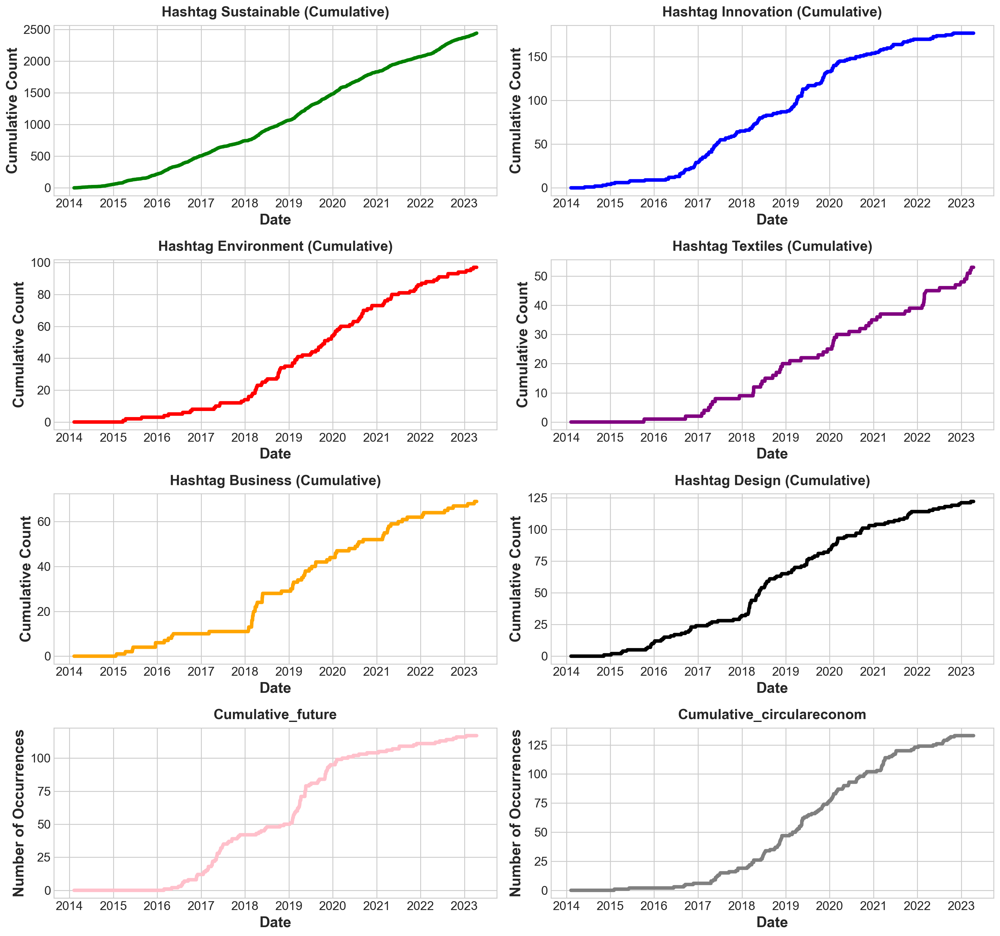

In [1142]:
import matplotlib.pyplot as plt

# 统计每个 Hashtag 列中每个日期的出现次数，并计算累计计数
df_plot = df.groupby('Date')[['Hashtag_sustainable', 'Hashtag_innovation', 'Hashtag_environment', 'Hashtag_textiles', 'Hashtag_business', 'Hashtag_design','Hashtag_future','Hashtag_circulareconomy']].sum().reset_index()
df_plot['Cumulative_sustainable'] = df_plot['Hashtag_sustainable'].cumsum()
df_plot['Cumulative_innovation'] = df_plot['Hashtag_innovation'].cumsum()
df_plot['Cumulative_environment'] = df_plot['Hashtag_environment'].cumsum()
df_plot['Cumulative_textiles'] = df_plot['Hashtag_textiles'].cumsum()
df_plot['Cumulative_business'] = df_plot['Hashtag_business'].cumsum()
df_plot['Cumulative_design'] = df_plot['Hashtag_design'].cumsum()
df_plot['Cumulative_future'] = df_plot['Hashtag_future'].cumsum()
df_plot['Cumulative_circulareconomy'] = df_plot['Hashtag_circulareconomy'].cumsum()

# 创建一个新的画布
fig, axs = plt.subplots(4, 2, figsize=(16, 15))

# 绘制第一个 Hashtag 的累计计数图
axs[0, 0].plot(df_plot['Date'], df_plot['Cumulative_sustainable'], color='green')
axs[0, 0].set_title('Hashtag Sustainable (Cumulative)')
axs[0, 0].set_xlabel('Date')
axs[0, 0].set_ylabel('Cumulative Count')
axs[0, 0].grid(True)

# 绘制第二个 Hashtag 的累计计数图
axs[0, 1].plot(df_plot['Date'], df_plot['Cumulative_innovation'], color='blue')
axs[0, 1].set_title('Hashtag Innovation (Cumulative)')
axs[0, 1].set_xlabel('Date')
axs[0, 1].set_ylabel('Cumulative Count')
axs[0, 1].grid(True)

# 绘制第三个 Hashtag 的累计计数图
axs[1, 0].plot(df_plot['Date'], df_plot['Cumulative_environment'], color='red')
axs[1, 0].set_title('Hashtag Environment (Cumulative)')
axs[1, 0].set_xlabel('Date')
axs[1, 0].set_ylabel('Cumulative Count')
axs[1, 0].grid(True)

# 绘制第四个 Hashtag 的累计计数图
axs[1, 1].plot(df_plot['Date'], df_plot['Cumulative_textiles'], color='purple')
axs[1, 1].set_title('Hashtag Textiles (Cumulative)')
axs[1, 1].set_xlabel('Date')
axs[1, 1].set_ylabel('Cumulative Count')
axs[1, 1].grid(True)

# 绘制第五个 Hashtag 的累计计数图
axs[2, 0].plot(df_plot['Date'], df_plot['Cumulative_business'], color='orange')
axs[2, 0].set_title('Hashtag Business (Cumulative)')
axs[2, 0].set_xlabel('Date')
axs[2, 0].set_ylabel('Cumulative Count')
axs[2, 0].grid(True)

# 绘制第六个 Hashtag 的
axs[2, 1].plot(df_plot['Date'], df_plot['Cumulative_design'], color='black')
axs[2, 1].set_title('Hashtag Design (Cumulative)')
axs[2, 1].set_xlabel('Date')
axs[2, 1].set_ylabel('Cumulative Count')
axs[2, 1].grid(True)

# 绘制第六个 Hashtag 的折线图
axs[3, 0].plot(df_plot['Date'], df_plot['Cumulative_future'], color='pink')
axs[3, 0].set_title('Cumulative_future')
axs[3, 0].set_xlabel('Date')
axs[3, 0].set_ylabel('Number of Occurrences')
axs[3, 0].grid(True)


# 绘制第六个 Hashtag 的折线图
axs[3, 1].plot(df_plot['Date'], df_plot['Cumulative_circulareconomy'], color='grey')
axs[3, 1].set_title('Cumulative_circulareconom')
axs[3, 1].set_xlabel('Date')
axs[3, 1].set_ylabel('Number of Occurrences')
axs[3, 1].grid(True)


In [625]:
# Séparation des tags
df = pd.concat([tweets1, tweets2, tweets3])
df = df.drop('Unnamed: 0', axis=1)
# Affichage du dataframe combiné
df['Date'] = pd.to_datetime(df['Date'])
# Création d'une colonne pour le mois
df['Month'] = df['Date'].dt.strftime('%Y-%m')

df['Quarter'] = df['Date'].dt.to_period('Q')
df1=df
#df1['Hashtags'] = df1['Hashtags'].str.split('[\[\],]')
df1['Hashtags'] = df1['Hashtags'].astype(str).str.replace('[\[\]]', '')
# Transformation de la colonne 'Hashtags' en une série de tags individuels
#tags = df1['Hashtags'].explode().str.strip()
df1.head()

,Date,User,Followers,Tweet,Likes,Shares,Hashtags,Month,Quarter
0,2023-04-13,AveryDennison,149014,Join #sustainable #fashion expert Debbie Shake...,6,0,"'sustainable', 'fashion', 'sustainability'",2023-04,2023Q2
1,2023-04-12,choosiishirlii,484,Hey #nftcolllectors! In town for #NFTNYC? Join...,7,5,"'nftcolllectors', 'NFTNYC', 'cryptoart', 'sust...",2023-04,2023Q2
2,2023-04-11,annkozma723,28312,See you soon! 🕛💕🗺️♻️🧵🪡 \n\nLIVE at 12pm Pacifi...,6,1,"'ecoactivism', 'sustainability', 'fashion'",2023-04,2023Q2
3,2023-04-10,AfricanCaribbe2,422,The #covid19 inspired us to think #sustainabil...,10,4,"'covid19', 'sustainability', 'fashion', 'Afric...",2023-04,2023Q2
4,2023-04-07,TysonLester,90554,Louis Vuitton— European luxury #Fashion brands...,14,4,"'Fashion', 'Metaverse', 'Brand', 'Sustainabili...",2023-04,2023Q2


In [626]:
df_hashtags = df1.loc[:, ['Date', 'Hashtags']]
df_hashtags['Hashtags'] = df_hashtags['Hashtags'].astype(str).str.replace('[\[\]]', '')

df_hashtags.head()

,Date,Hashtags
0,2023-04-13,"'sustainable', 'fashion', 'sustainability'"
1,2023-04-12,"'nftcolllectors', 'NFTNYC', 'cryptoart', 'sust..."
2,2023-04-11,"'ecoactivism', 'sustainability', 'fashion'"
3,2023-04-10,"'covid19', 'sustainability', 'fashion', 'Afric..."
4,2023-04-07,"'Fashion', 'Metaverse', 'Brand', 'Sustainabili..."


les 10 mots les plus associés sont: 
Industry:179
New:153
Future: 139
Innovation:118
Clothes: 105

In [675]:
df2=df
df2.head(2)
#df2.columns

,Date,User,Followers,Tweet,Likes,Shares,Month,Quarter,Hashtag_sustainable,Hashtag_Fashion,...,Hashtag_fashiontech,Hashtag_design,Hashtag_environment,Hashtag_ethicalfashion,Hashtag_ecofashion,Hashtag_tech,Hashtag_business,Hashtag_ecofriendly,Hashtag_fastfashion,Hashtag_textiles
0,2023-04-13,AveryDennison,149014,Join #sustainable #fashion expert Debbie Shake...,6,0,2023-04,2023Q2,1,1,...,0,0,0,0,0,0,0,0,0,0
1,2023-04-12,choosiishirlii,484,Hey #nftcolllectors! In town for #NFTNYC? Join...,7,5,2023-04,2023Q2,1,1,...,0,0,0,0,0,0,0,0,0,0


In [676]:
import pandas as pd


df2 = df2.set_index('Date')
df3 = df2[['Hashtag_sustainable', 'Hashtag_Fashion', 'Hashtag_innovation', 'Hashtag_circulareconomy', 'Hashtag_design', 'Hashtag_environment', 'Hashtag_textiles']]

df_quarterly = df3.resample('Q').sum()

# 将缺失值填充为 0
df_quarterly = df_quarterly.fillna(0)
df_quarterly.head(5)

,Hashtag_sustainable,Hashtag_Fashion,Hashtag_innovation,Hashtag_circulareconomy,Hashtag_design,Hashtag_environment,Hashtag_textiles
Date,,,,,,,
2014-03-31,5,5,0,0,0,0,0
2014-06-30,12,12,1,0,0,0,0
2014-09-30,12,12,1,0,0,0,0
2014-12-31,28,28,2,0,1,0,0
2015-03-31,35,35,2,1,1,1,0


In [677]:
# 只保留需要计算增长趋势的 Hashtag 列
df_trends = df3[['Hashtag_sustainable', 'Hashtag_Fashion', 'Hashtag_innovation', 'Hashtag_circulareconomy', 'Hashtag_design', 'Hashtag_environment', 'Hashtag_textiles']]

# 计算每个 Hashtag 列的半年平均值
df_avg = df3[['Hashtag_sustainable', 'Hashtag_Fashion', 'Hashtag_innovation', 'Hashtag_circulareconomy', 'Hashtag_design', 'Hashtag_environment', 'Hashtag_textiles']].rolling(window=2).mean()
df_avg=df_avg.dropna(axis=0)
df_avg.head()

,Hashtag_sustainable,Hashtag_Fashion,Hashtag_innovation,Hashtag_circulareconomy,Hashtag_design,Hashtag_environment,Hashtag_textiles
Date,,,,,,,
2023-04-12,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2023-04-11,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2023-04-10,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2023-04-07,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2023-04-06,1.0,1.0,0.0,0.0,0.0,0.0,0.0


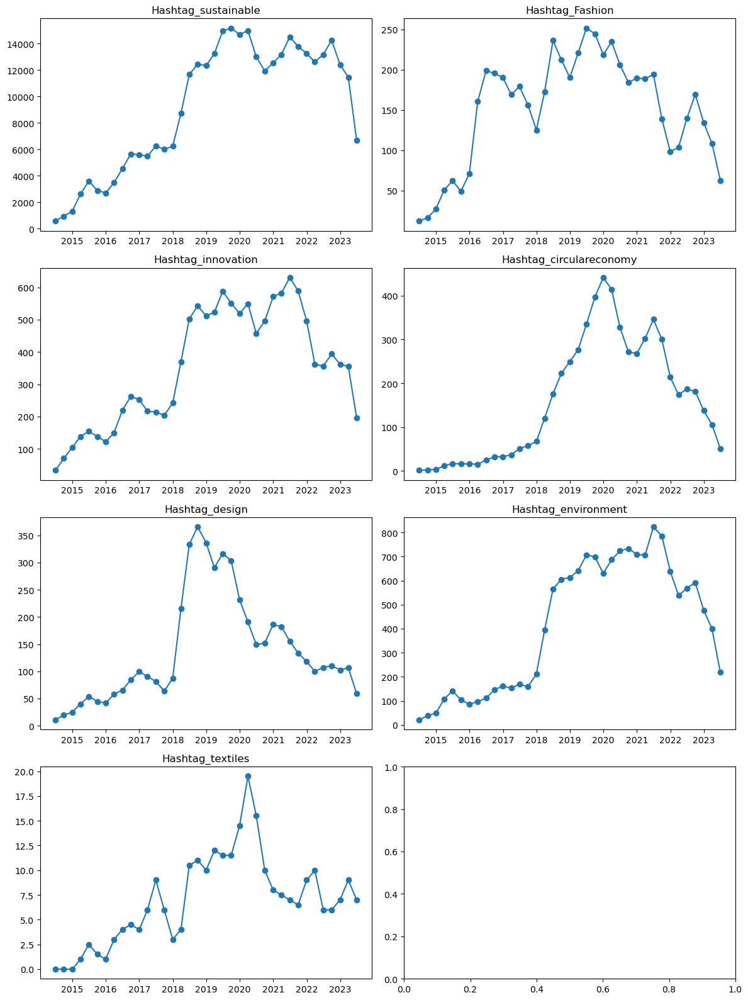

In [117]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12, 16))

# loop through each column of the DataFrame and plot it on the corresponding subplot
for i, col in enumerate(df_avg.columns):
    ax = axes[i // 2, i % 2]  # select the subplot for this column
    ax.plot(df_avg[col], marker='o')  # plot the column as a line
    ax.set_title(col)  # set the subplot title to the column name

plt.tight_layout()  # adjust the spacing between subplots
plt.show()  # display the plot


On peut voir qu'il y a une chute de pention de quasiment tous les mots clés dans les postes qui mentionnent 'sustainability' et 'fashion'

# Sustainability 

In [86]:
import pandas as pd
df=pd.read_csv("tweets_all_sustainability.csv")
df = df.drop('Unnamed: 0', axis=1)
df['Date'] = pd.to_datetime(df['Date'])
df['Hashtags'] = df['Hashtags'].astype(str).str.replace('[\[\]]', '')
df.head()

,Date,User,Followers,Tweet,Likes,Shares,Hashtags
0,2023-04-13,Dapper_Ud,1161,This will represents a sort of hashrate in the...,8,0,"'Bitcoin', 'CUDOS', 'SUSTAINABILITY'"
1,2023-04-13,jjwalsh,5654,Refill &amp; Reuse containers are always bette...,5,0,"'Sustainability', 'Japan', 'MUJI', 'reuse', 's..."
2,2023-04-13,BaytexEnergy,3759,Baytex Announces Pricing of Upsized Private Of...,11,3,"'Earnings', 'Energy', 'Oil', 'OilAndGas', 'Sus..."
3,2023-04-13,opportunitiesfy,16645,Join UNEP &amp; UNV in solving the triple plan...,13,9,"'UN', 'sustainability', 'hiring', 'Kenya'"
4,2023-04-13,BarHBARian,30736,2/\nOrganisations are coming forward with inno...,15,0,'sustainability'


In [14]:
df['Hashtags']

0                      'Bitcoin', 'CUDOS', 'SUSTAINABILITY'
1         'Sustainability', 'Japan', 'MUJI', 'reuse', 's...
2         'Earnings', 'Energy', 'Oil', 'OilAndGas', 'Sus...
3                 'UN', 'sustainability', 'hiring', 'Kenya'
4                                          'sustainability'
                                ...                        
340566               'earth', 'sustainability', 'inspiring'
340567    'edchatie', 'ukedchat', 'science', 'edchat', '...
340568    'poverty', 'Sustainability', 'post2015', 'Worl...
340569                                     'sustainability'
340570                  'retail', 'sustainability', 'LOCAL'
Name: Hashtags, Length: 340571, dtype: object

In [16]:
# concatenate all the hashtags into a single string
hashtags = ' '.join(df['Hashtags']).replace(',', '').replace('[', '').replace(']', '')

# count the frequency of each hashtag
tag_counts = Counter(hashtags.split())

# get the 20 most common hashtags
top_20_tags = tag_counts.most_common(20)

# print the results
for tag, count in top_20_tags:
    print(tag, count)

'sustainability' 210141
'Sustainability' 130968
'SDGs' 13339
'innovation' 12121
'environment' 11775
'climatechange' 11310
'AI' 6510
'ClimateAction' 6252
'ESG' 6191
'ClimateChange' 6107
'circulareconomy' 5908
'energy' 5508
'climate' 5308
'sustainable' 5288
'IoT' 4716
'CSR' 4375
'nature' 4190
'Innovation' 3968
'green' 3719
'recycling' 3557


In [19]:
import re
import nltk
from nltk.corpus import stopwords
from collections import Counter

# nettoyage des tweets : suppression des ponctuations, des chiffres et des liens
def clean_text(text):
    text = re.sub(r'[^\w\s]', '', text) # supprimer les ponctuations
    text = re.sub(r'\d+', '', text) # supprimer les chiffres
    text = re.sub(r'http\S+', '', text) # supprimer les liens
    return text.lower()

# télécharger la liste de stopwords en anglais
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

# fonction pour extraire les mots clés à partir du texte nettoyé
def extract_keywords(text):
    keywords = []
    words = nltk.word_tokenize(text) # tokenisation du texte en mots
    for word in words:
        if word not in stop_words: # suppression des stopwords
            keywords.append(word)
    return Counter(keywords).most_common(20) # retourne les 10 mots les plus fréquents

# appliquer les fonctions de nettoyage et d'extraction de mots clés à la colonne "Tweet"
df['Cleaned_Tweet'] = df['Tweet'].apply(lambda x: clean_text(x))
df['Keywords'] = df['Cleaned_Tweet'].apply(lambda x: extract_keywords(x))

# afficher les 10 mots clés les plus fréquents dans tous les tweets
keywords_all = []
for keywords in df['Keywords']:
    for keyword in keywords:
        keywords_all.append(keyword[0])
counter_all = Counter(keywords_all)
print(counter_all.most_common(10))


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\solen\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


[('sustainability', 295521), ('amp', 45906), ('sustainable', 28352), ('new', 24731), ('great', 17939), ('environment', 17611), ('us', 17528), ('innovation', 17407), ('today', 17113), ('climatechange', 15692)]


In [20]:
counter_all.most_common(15)

[('sustainability', 295521),
 ('amp', 45906),
 ('sustainable', 28352),
 ('new', 24731),
 ('great', 17939),
 ('environment', 17611),
 ('us', 17528),
 ('innovation', 17407),
 ('today', 17113),
 ('climatechange', 15692),
 ('future', 15325),
 ('energy', 15296),
 ('climate', 13162),
 ('green', 13141),
 ('business', 12380)]

# NLP

In [93]:
import re
import string
import nltk
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import operator
import os.path as op
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob
from wordcloud import WordCloud

In [87]:
data_brute=pd.read_csv("tweets_all_sustainability.csv", index_col=0)
data=data_brute.copy()

In [88]:
def clean_and_tokenize(text):
    """
    Cleaning a document with:
        - Lowercase        
        - Removing numbers with regular expressions
        - Removing punctuation with regular expressions
        - Removing other artifacts
    And separate the document into words by simply splitting at spaces
    Params:
        text (string): a sentence or a document
    Returns:
        tokens (list of strings): the list of tokens (word units) forming the document
    """        
    # Lowercase
    text = text.lower()

    # Remove numbers
    text = re.sub(r'\d+', '', text)  

    # Remove small words (1 and 2 characters)
    text = re.sub(r"\b\w{1,2}\b", "", text)

    # Remove HTML artifacts specific to the corpus we're going to work with
    REPLACE_HTML = re.compile("(<br\s*/><br\s*/>)|(\-)|(\/)")
    text = REPLACE_HTML.sub(" ", text)

    tokens = word_tokenize(text)        
    return tokens


In [91]:
data["Tweet"] = data["Tweet"].apply(clean_and_tokenize) # application de la fonction 
nltk.download('stopwords') # liste des mots anglais considérés comme "vides" car très courant
stop_words = set(stopwords.words('english'))
data['Tweet'] = data['Tweet'].apply(lambda x: ' '.join([word for word in x if word.lower() not in stop_words]))
# suppression des mots vides de notre dataset

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\solen\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Modèle et analyse
En raison de l'absence d'une colonne pouvant nous permettre de créer notre propre modèle. La colonne en question que nous nommerons "Sentimental" permet de savoir si le tweet est plutôt négatif, positif ou neutre.

Pour se faire, nous utiliserons un modèle pré-entrainé nommé Sentiment140. Il appartient à la librairie TextBlob. Il a été entrainé sur un corpus de 1,6 million de tweets. Il prédit si un tweet est positif ou négatif.

La polarité est un score continu compris entre -1 et 1, où -1 représente un sentiment très négatif, 0 représente un sentiment neutre et 1 représente un sentiment très positif

In [94]:
# test sur deux tweets random
tweet = "I love this product! It's the best thing ever!"
tweet2 = "I hate this product"
blob1 = TextBlob(tweet)
blob2 = TextBlob(tweet2)


if blob1.sentiment.polarity > 0:
    print("Le tweet est positif")
elif blob1.sentiment.polarity < 0:
    print("Le tweet est négatif")
else:
    print("Le tweet est neutre")
    
if blob2.sentiment.polarity > 0:
    print("Le tweet est positif")
elif blob2.sentiment.polarity < 0:
    print("Le tweet est négatif")
else:
    print("Le tweet est neutre")



Le tweet est positif
Le tweet est négatif


In [95]:
# Nouvelle colonne pour stocker le sentiment
data['Sentiment_TB'] = ''
# Application du modèle à tout le dataset
for i, row in data.iterrows():
    text = row['Tweet']
    sentiment = TextBlob(text).sentiment.polarity
    data.at[i, 'Sentiment_TB'] = sentiment
# Nouvelle colonne 'Sentiment' avec les valeurs arrondies de 'Sentiment_TB'
data['Sentiment'] = data['Sentiment_TB'].apply(lambda x: round(x, 2))
distinct_sentiments = data['Sentiment'].unique()
print(distinct_sentiments)
# On peut supposer au vu des chiffres de la présence de toutes les polarités.

[ 0.    0.31  0.17  0.1   0.22  0.5   0.14  0.13 -0.13  0.12  0.19  0.11
  0.09  0.2   0.4   0.41  0.25  0.24  0.29  0.01  0.6  -0.4   0.02  0.07
 -0.1   0.28  0.03  0.35  0.3   0.27 -0.05 -0.01  0.06 -0.5  -0.04 -0.07
  0.45  0.8   0.18  0.78  0.05  0.33  0.7  -0.03  0.47  0.62  0.38 -0.2
  1.    0.43  0.67  0.34  0.32  0.53 -0.02  0.08  0.15  0.21  0.57  0.36
  0.26  0.23  0.46  0.39 -0.12  0.85 -0.08  0.56 -0.38 -0.06  0.61  0.94
  0.81 -0.14  0.16  0.04 -0.15  0.58  0.44  0.42  0.98 -0.27  0.83 -0.18
  0.65 -0.09 -0.3   0.93  0.88  0.63 -0.17  0.37  0.69  0.68 -0.55  0.66
  0.52 -0.26  0.59  0.48 -0.21 -0.28  0.64  0.75  0.74 -0.34 -0.25  0.9
  0.55  0.51 -0.8   0.73 -0.24 -0.23  0.79  0.95 -0.36 -0.33  0.82  0.54
 -0.19  0.84  0.49 -0.44 -1.   -0.16 -0.35 -0.37 -0.31 -0.67 -0.22  0.87
  0.77 -0.11 -0.47 -0.48  0.76 -0.6   0.71 -0.32  0.72 -0.59 -0.41 -0.45
 -0.75 -0.29 -0.57 -0.85  0.92 -0.78 -0.62 -0.71 -0.54 -0.39 -0.43 -0.52
 -0.61 -0.7   0.86 -0.87 -0.65 -0.94 -0.72 -0.83  0.8

In [96]:
mean_sentiment = data['Sentiment'].mean()
mean_sentiment

0.17417742555885313

Neutral     231246
Positive    102910
Negative      6262
Name: Sentiment_Range, dtype: int64


<AxesSubplot:ylabel='Sentiment_Range'>

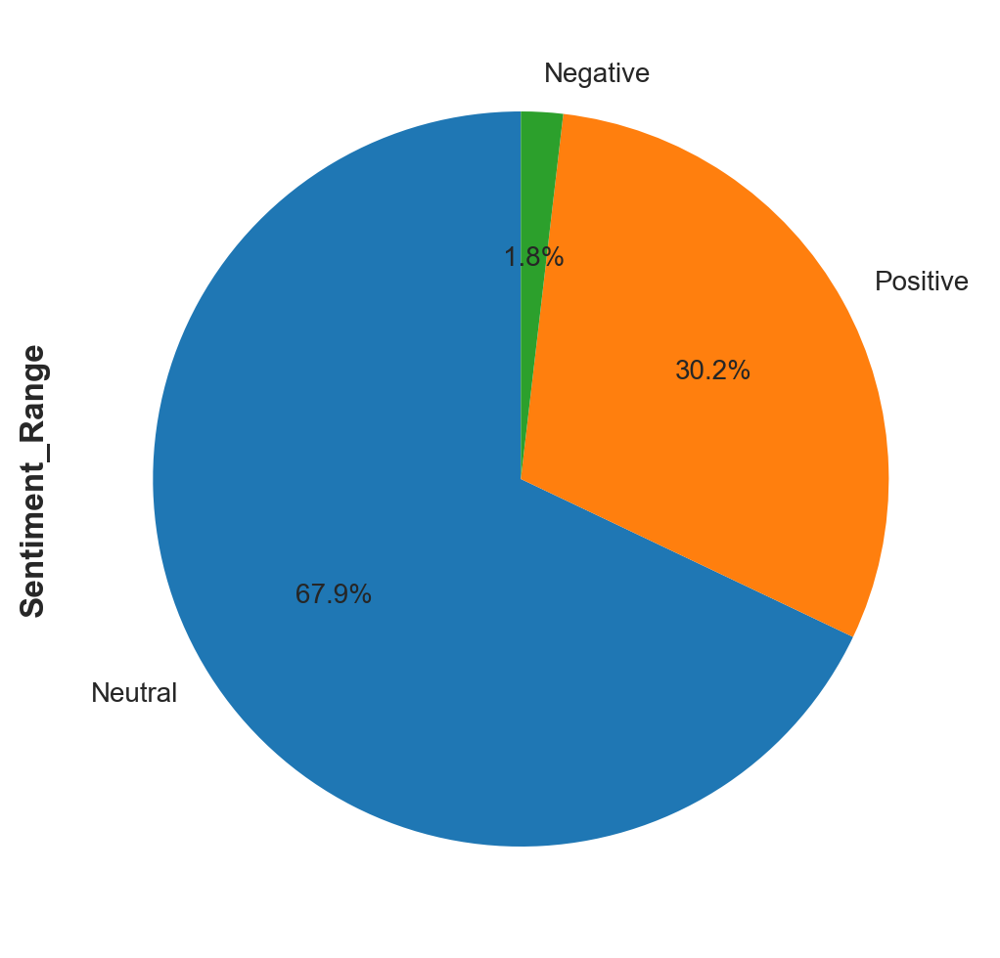

In [97]:
# Catégorisation de chaque sentiment dans une plage correspondante
data['Sentiment_Range'] = pd.cut(data['Sentiment'], bins=[-1, -0.25, 0.25, 1], labels=['Negative', 'Neutral', 'Positive'])
# Compter le nombre de tweets dans chaque groupe
count_sentiments = data['Sentiment_Range'].value_counts()
print(count_sentiments)

# Afficher un graphique camembert
count_sentiments.plot(kind='pie', autopct='%1.1f%%', startangle=90)

# Le nombre de tweets neutres est de 278922, ce qui correspond à 81,9% de l'ensemble du dataset. 

<AxesSubplot:ylabel='Frequency'>

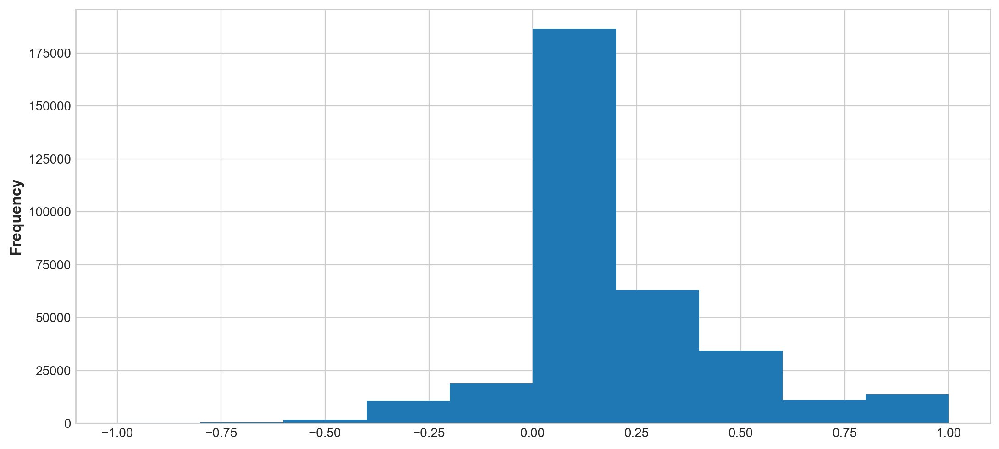

In [98]:
data['Sentiment'].plot(kind='hist')
# Par ce graphique, on voit bien la présence de la majorité des tweets entre 0 et 0,25

In [99]:
# Calculer la moyenne de chaque groupe
mean_sentiments = data.groupby('Sentiment_Range').mean()
print(mean_sentiments)

# Les tweets neutres ont légèrement plus de likes. 
# Les comtpes avec des tweets négatifs sont largement plus suivis. 

                    Followers      Likes    Shares  Sentiment
Sentiment_Range                                              
Negative         66416.142127  18.567071  8.776749  -0.381500
Neutral          58235.487394  22.533704  9.253725   0.043140
Positive         31799.602993  21.061918  8.064863   0.504187


In [100]:
# Calculer la moyenne de chaque groupe
mean_sentiments['sum']= data['Sentiment_Range'].value_counts()
mean_sentiments

,Followers,Likes,Shares,Sentiment,sum
Sentiment_Range,,,,,
Negative,66416.142127,18.567071,8.776749,-0.381500,6262
Neutral,58235.487394,22.533704,9.253725,0.043140,231246
Positive,31799.602993,21.061918,8.064863,0.504187,102910


In [101]:
neutral_tweets = data[data['Sentiment_Range'] == 'Neutral']['Tweet']
positive_tweets = data[data['Sentiment_Range'] == 'Positive']['Tweet']
negative_tweets = data[data['Sentiment_Range'] == 'Negative']['Tweet']
def clean_text(text):
    stop_words = set(['sustainability','sustainable','amp','https','http','the', 'and', 'in', 'of', 'to', 'a', 'that', 'is', 'for', 'on', 'with', 'this', 'be', 'as', 'it', 'are', 'an', 'or', 'by', 'from', 'at', 'have', 'has', 'been', 'was', 'were', 'will', 'would', 'can', 'could', 'should', 'if', 'not', 'but', 'who', 'what', 'when', 'where', 'why', 'how'])
    words = nltk.word_tokenize(text.lower())
    words = [word for word in words if word.isalpha() and word not in stop_words]
    return words


In [105]:
neutral_words = [word for tweet in neutral_tweets for word in clean_text(tweet)]
positive_words = [word for tweet in positive_tweets for word in clean_text(tweet)]
negative_words = [word for tweet in negative_tweets for word in clean_text(tweet)]

neutral_freq = nltk.FreqDist(neutral_words)
positive_freq = nltk.FreqDist(positive_words)
negative_freq = nltk.FreqDist(negative_words)

neutral_top_words = [word for word, count in neutral_freq.most_common(15)]
positive_top_words = [word for word, count in positive_freq.most_common(15)]
negative_top_words = [word for word, count in negative_freq.most_common(15)]

In [107]:
def plot_word_cloud(text, mask=None):
    stop_words = set(['amp','https','http','the', 'and', 'in', 'of', 'to', 'a', 'that', 'is', 'for', 'on', 'with', 'this', 'be', 'as', 'it', 'are', 'an', 'or', 'by', 'from', 'at', 'have', 'has', 'been', 'was', 'were', 'will', 'would', 'can', 'could', 'should', 'if', 'not', 'but', 'who', 'what', 'when', 'where', 'why', 'how'])
    wc = WordCloud(width=600, height=600, background_color='white', max_words=200, stopwords=stop_words, max_font_size=90, collocations=False, random_state=42, mask=mask)
    wc.generate(text)
    
    plt.figure(figsize=(8, 6))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.show()

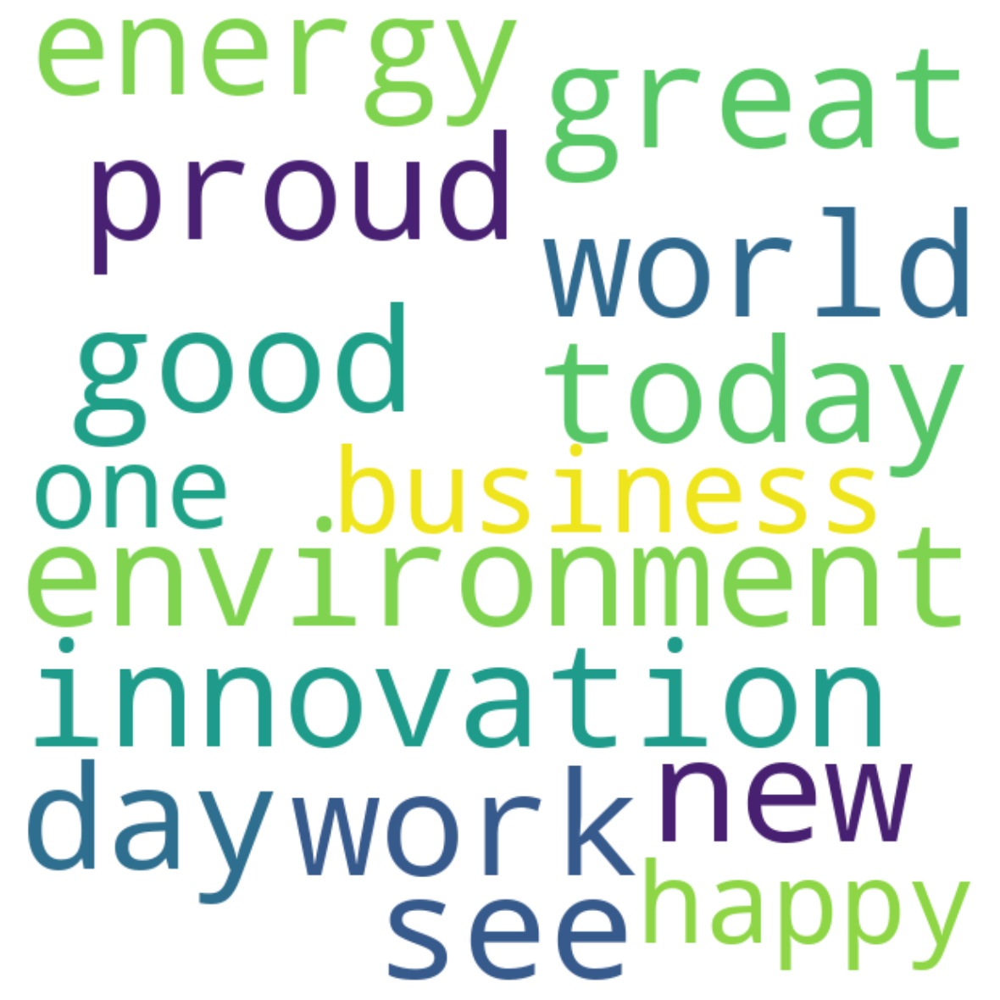

['great', 'today', 'new', 'proud', 'good', 'innovation', 'see', 'environment', 'work', 'world', 'day', 'energy', 'business', 'happy', 'one']


In [108]:
text = ' '.join(positive_top_words)
plot_word_cloud(text)
print(positive_top_words)

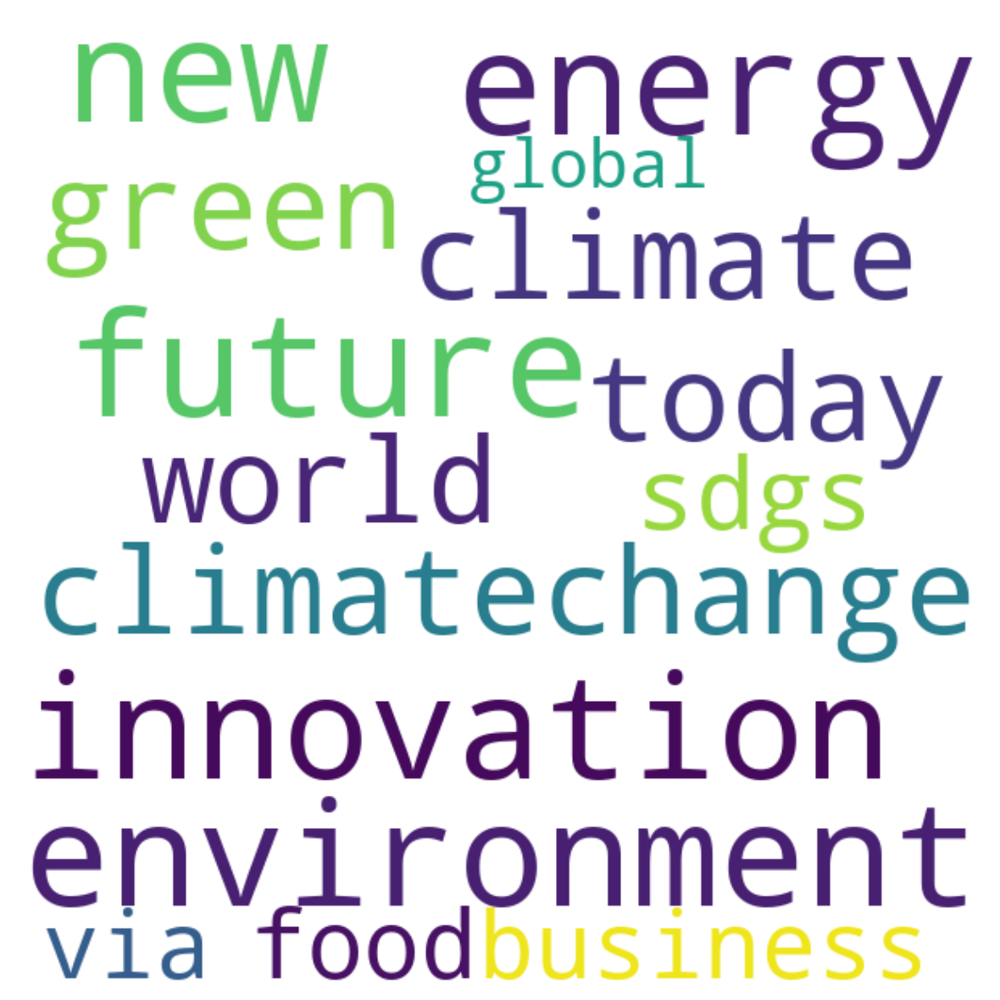

['new', 'future', 'environment', 'energy', 'innovation', 'climatechange', 'green', 'today', 'climate', 'world', 'sdgs', 'food', 'business', 'via', 'global']


In [109]:
text = ' '.join(neutral_top_words)
plot_word_cloud(text)
print(neutral_top_words)

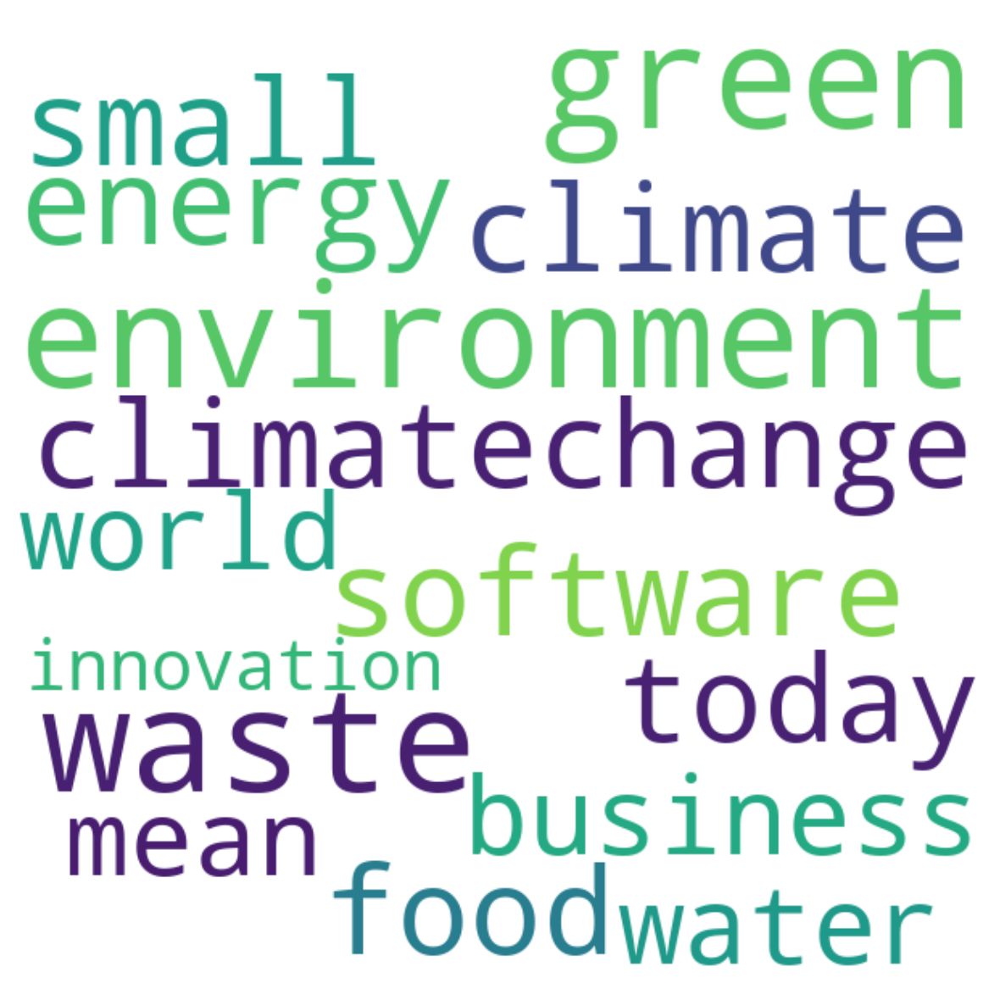

['green', 'environment', 'waste', 'climatechange', 'small', 'food', 'software', 'energy', 'climate', 'today', 'business', 'water', 'mean', 'world', 'innovation']


In [110]:
text = ' '.join(negative_top_words)
plot_word_cloud(text)
print(negative_top_words)

# Sales datafile

In [28]:
import pandas as pd
df = pd.read_csv('sales.csv')
df=df.drop('Unnamed: 0', axis=1)
df.head()

,external_code,retail,season,category,color,image_path,fabric,release_date,restock,0,...,2,3,4,5,6,7,8,9,10,11
0,5,36,SS17,long sleeve,grey,PE17/00005.png,acrylic,2016-11-28,22,1.0,...,1.0,1.0,2.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0
1,2,51,SS17,long sleeve,violet,PE17/00002.png,acrylic,2016-11-28,17,1.0,...,1.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,1.0,0.0
2,5,10,SS17,long sleeve,grey,PE17/00005.png,acrylic,2016-11-28,15,1.0,...,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0
3,9,41,SS17,culottes,yellow,PE17/00009.png,scuba crepe,2016-11-28,32,1.0,...,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
4,5,13,SS17,long sleeve,grey,PE17/00005.png,acrylic,2016-11-28,26,1.0,...,4.0,0.0,3.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0


In [306]:
df.columns

Index(['external_code', 'retail', 'season', 'category', 'color', 'image_path',
       'fabric', 'release_date', 'restock', '0', '1', '2', '3', '4', '5', '6',
       '7', '8', '9', '10', '11'],
      dtype='object')

In [1147]:
df.groupby('fabric')['retail'].sum().sort_values(ascending=False).head(20)


fabric
georgette        752254
nice             399125
cotton           257419
scuba crepe      206357
acrylic          199818
tulle            197626
frise            171967
matte jersey     140428
faux leather     136762
silky satin      136734
lurex            136177
embossed         125624
viscose twill    125288
technical        115391
bengaline        112913
polyviscous      107064
foam rubber       98797
lace              92625
cloth             79410
crepe             75842
Name: retail, dtype: int64

In [1148]:
list=['acrylic','georgette','nice','cotton','lace']

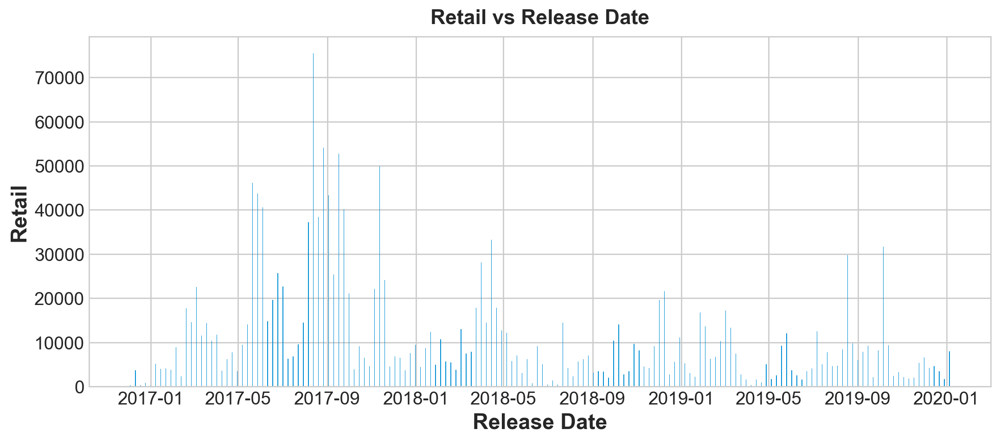

In [1276]:
import pandas as pd
import matplotlib.pyplot as plt
df['release_date']=pd.to_datetime(df['release_date'])
total= df.groupby(['fabric', pd.Grouper(key='release_date', freq='M')])['retail'].sum().reset_index(name='retail')

# count the number of times each material is used per month
total['release_date'] = pd.to_datetime(df_top10_retail['release_date'])

total=total.drop(columns=['fabric'])
total=total.dropna()
plt.bar(total['release_date'], total['retail'])
plt.xlabel('Release Date')
plt.ylabel('Retail')
plt.title('Retail vs Release Date')
plt.show()

Nous allons s'interesser à des materiaux polluants comme acrylic, georgette and nice
ainsi que les materiaux ecologiques comme cotton et lace

In [1156]:
import pandas as pd
import matplotlib.pyplot as plt
from itertools import zip_longest

fabric_freq = df.groupby('fabric')['retail'].sum().sort_values(ascending=False)

# subset the data for the top 10 materials
df_top10 = df[df['fabric'].isin(list)]
#df_top10 = df_top10.drop('Unnamed: 0', axis=1)
df['release_date'] = pd.to_datetime(df['release_date'])
df_top10.head()

,external_code,retail,season,category,color,image_path,fabric,release_date,restock,0,...,2,3,4,5,6,7,8,9,10,11
0,5,36,SS17,long sleeve,grey,PE17/00005.png,acrylic,2016-11-28,22,1.0,...,1.0,1.0,2.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0
1,2,51,SS17,long sleeve,violet,PE17/00002.png,acrylic,2016-11-28,17,1.0,...,1.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,1.0,0.0
2,5,10,SS17,long sleeve,grey,PE17/00005.png,acrylic,2016-11-28,15,1.0,...,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0
4,5,13,SS17,long sleeve,grey,PE17/00005.png,acrylic,2016-11-28,26,1.0,...,4.0,0.0,3.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0
5,5,41,SS17,long sleeve,grey,PE17/00005.png,acrylic,2016-11-28,15,2.0,...,2.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0


In [1157]:
import pandas as pd
import matplotlib.pyplot as plt

# count the number of times each material is used per month
df_top10['release_date'] = pd.to_datetime(df_top10['release_date'])
df_top10 = df_top10.groupby(['fabric', pd.Grouper(key='release_date', freq='W')])['retail'].sum().reset_index(name='retail')
df_top10.head()

,fabric,release_date,retail
0,acrylic,2016-12-04,238
1,acrylic,2016-12-11,2778
2,acrylic,2016-12-18,786
3,acrylic,2016-12-25,99
4,acrylic,2017-01-01,74


In [1159]:
import pandas as pd
import matplotlib.pyplot as plt
df_top10 = df[df['fabric'].isin(list)]
df_top10['release_date'] = pd.to_datetime(df_top10['release_date'])
df_top10_retail = df_top10.groupby(['fabric', pd.Grouper(key='release_date', freq='W')])['retail'].sum().reset_index(name='retail')

# count the number of times each material is used per month
df_top10_retail['release_date'] = pd.to_datetime(df_top10_retail['release_date'])
#df_top10 = df_top10.groupby(['fabric', pd.Grouper(key='release_date', freq='W')])['retail'].sum().reset_index(name='restock')
df_top10_retail.head()

,fabric,release_date,retail
0,acrylic,2016-12-04,238
1,acrylic,2016-12-11,2778
2,acrylic,2016-12-18,786
3,acrylic,2016-12-25,99
4,acrylic,2017-01-01,74


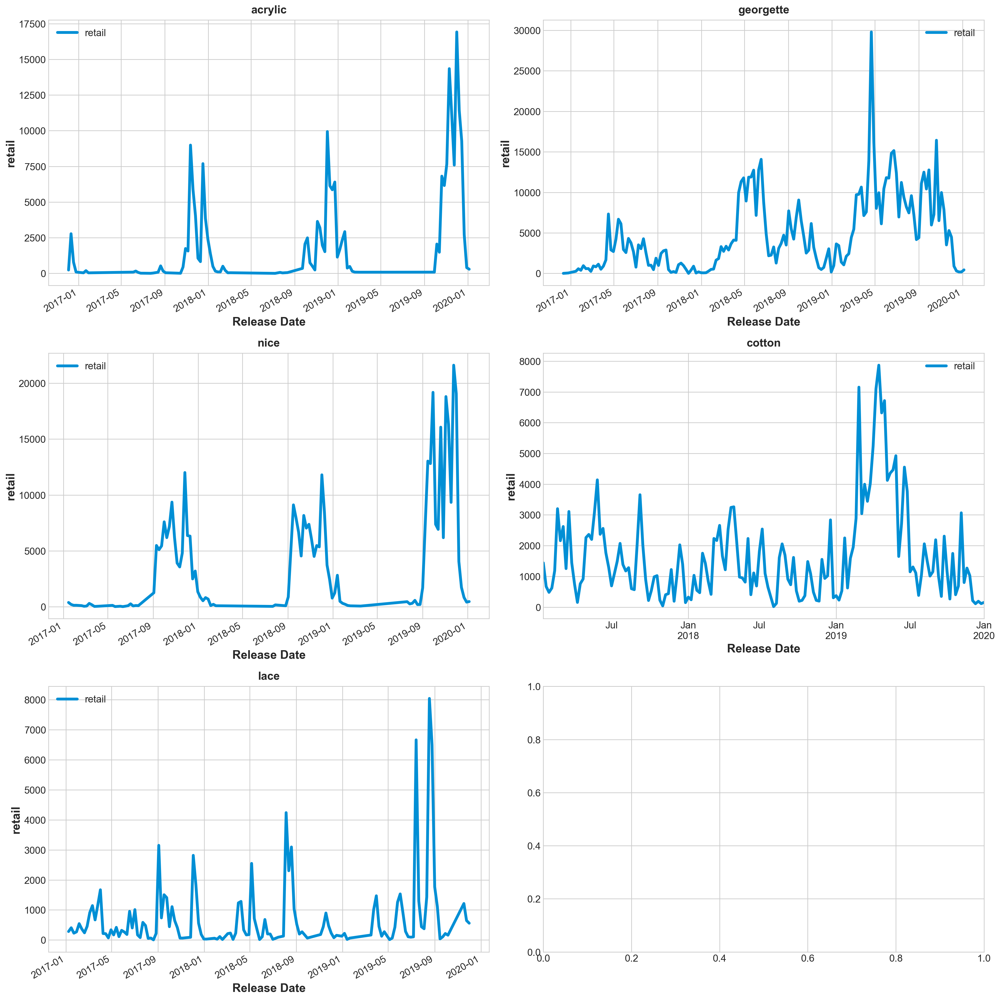

In [325]:
# create a line plot for each material
n_rows = 3
n_cols = 2
fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, 20))
plots = []
for idx, material in enumerate(list):
    # subset the data for the current material
    df_material_retail = df_top10_retail[df_top10_retail['fabric'] == material]
    
    # create the plot
    row = idx // n_cols
    col = idx % n_cols
    plot = df_material_retail.plot(x='release_date', y='retail', ax=axs[row][col], title=material)
    plot.set_xlabel('Release Date')
    plot.set_ylabel('retail')
    
    # append the plot to the list of plots
    plots.append(plot)


# adjust layout
plt.tight_layout()

# display the plots
plt.show()


In [369]:
df.head(2)

,external_code,retail,season,category,color,image_path,fabric,release_date,restock,0,...,2,3,4,5,6,7,8,9,10,11
0,5,36,SS17,long sleeve,grey,PE17/00005.png,acrylic,2016-11-28,22,1.0,...,1.0,1.0,2.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0
1,2,51,SS17,long sleeve,violet,PE17/00002.png,acrylic,2016-11-28,17,1.0,...,1.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,1.0,0.0


Ecological materials
Cotton: in general, cotton is considered a more sustainable option as it is a natural fiber and can be grown without synthetic fertilizers and pesticides. 
Lace: Lace is a delicate fabric made of yarn or thread in an open weblike pattern. It is often used for decorative purposes in clothing and home decor. Lace can be made by hand or by machine, and is commonly used in bridal wear, lingerie, and table linens.

Mateterials that are less ecological
Nice is a fabric that is made from a combination of polyester and nylon fibers. The production process of nice involves the extraction of crude oil which is then processed into polyester and nylon fibers through a chemical process. These fibers are then spun into yarn which is then woven into the final fabric.

The ecological impact of producing nice fabric includes the use of non-renewable resources like crude oil, the emission of greenhouse gases during the production process, and the release of toxic chemicals used in the chemical processes involved in making the fabric.

Georgette is a sheer, lightweight fabric made of silk, polyester, or rayon. It is typically used for dresses, blouses, and scarves. Georgette is a synthetic fabric and its production involves the use of chemicals and energy, making it not the most eco-friendly choice. 

Acrylic is a type of fabric that is made from a blend of polyester and spandex. It is known for its smooth, silky texture and is commonly used in women's clothing, such as dresses and skirts. The production of nice fabric involves the use of synthetic materials, which can have a negative environmental impact. Additionally, polyester is a non-biodegradable material, which means it takes a long time to break down in landfills. 
Therefore, from a sustainability point of view, georgette and nice are not the most eco-friendly choices.

In [29]:
df2=pd.read_csv('price_discount_series.csv')
merged_df = pd.merge(df, df2, on=['external_code', 'retail'])

# Save the merged dataframe to a new CSV file
merged_df.to_csv('merged_file.csv', index=False)
df3=pd.read_csv('vis2_weather_data.csv')
df3['date'] = pd.to_datetime(df3['date'])
df3 = df3.rename(columns={'avg temp °C': 'avg_temp'})
df3 = df3.rename(columns={'max temp °C': 'max_temp'})
merged_df.head()

C:\Users\solen\AppData\Local\Temp\ipykernel_9884\4013853519.py:7: UserWarning: Parsing '13/10/2016' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  df3['date'] = pd.to_datetime(df3['date'])
C:\Users\solen\AppData\Local\Temp\ipykernel_9884\4013853519.py:7: UserWarning: Parsing '14/10/2016' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  df3['date'] = pd.to_datetime(df3['date'])
C:\Users\solen\AppData\Local\Temp\ipykernel_9884\4013853519.py:7: UserWarning: Parsing '15/10/2016' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  df3['date'] = pd.to_datetime(df3['date'])
C:\Users\solen\AppData\Local\Temp\ipykernel_9884\4013853519.py:7: UserWarning: Parsing '16/10/2016' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  df3['date'] = pd.to_datetime(df3['date'])
C:\Users\solen\AppData\Local

,external_code,retail,season,category,color,image_path,fabric,release_date,restock,0_x,...,3_y,4_y,5_y,6_y,7_y,8_y,9_y,10_y,11_y,price
0,5,36,SS17,long sleeve,grey,PE17/00005.png,acrylic,2016-11-28,22,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.054944
1,2,51,SS17,long sleeve,violet,PE17/00002.png,acrylic,2016-11-28,17,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.2,0.2,0.054944
2,5,10,SS17,long sleeve,grey,PE17/00005.png,acrylic,2016-11-28,15,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.054944
3,9,41,SS17,culottes,yellow,PE17/00009.png,scuba crepe,2016-11-28,32,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.043951
4,5,13,SS17,long sleeve,grey,PE17/00005.png,acrylic,2016-11-28,26,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.054944


# Analyse Acrylique

In [1298]:
acrylic_restock_df = df[df['fabric'] == 'acrylic'][['retail', 'release_date']].set_index('release_date')
acrylic_restock_df.columns = ['acrylic_retail']
acrylic_restock_df = acrylic_restock_df.astype({'acrylic_retail': int})
acrylic_restock_df.index = pd.to_datetime(acrylic_restock_df.index)
#acrylic_restock_weekly = acrylic_restock_df.resample('W').sum()
#acrylic_restock_weekly.plot()


<AxesSubplot:xlabel='release_date'>

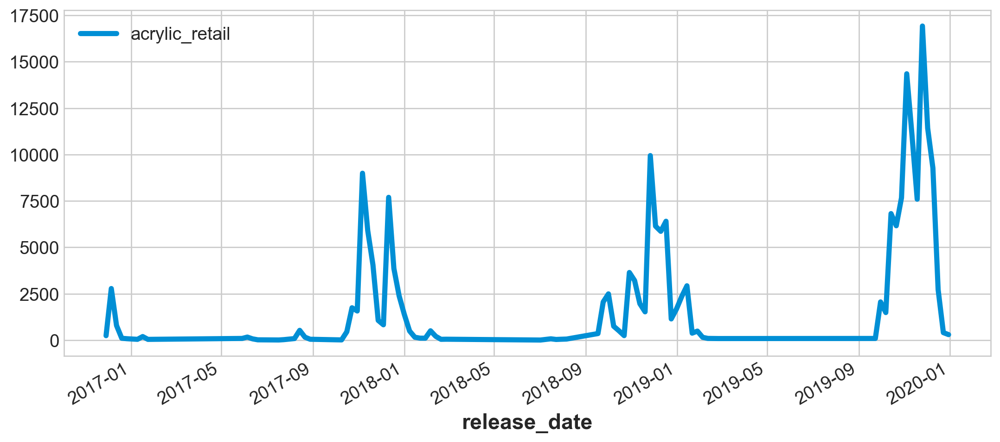

In [1299]:
acrylic_restock_df = acrylic_restock_df.groupby('release_date').sum()
acrylic_restock_df.plot()

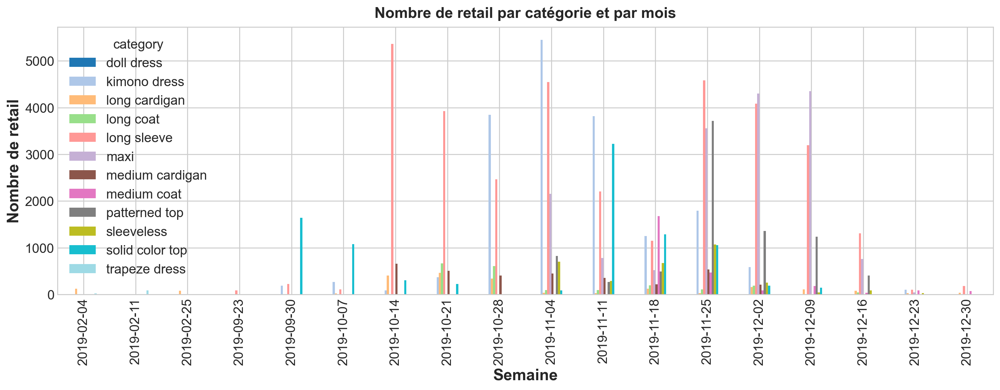

In [1302]:

import pandas as pd
import matplotlib.pyplot as plt
cotton_restock_df = df[df['fabric'] == 'acrylic'][['retail', 'release_date','category']].set_index('release_date')

# Filtrer les données entre janvier 2019 et mai 2019
start_date = '2019-02-01'
end_date = '2019-12-30'
df_filtered = cotton_restock_df.loc[start_date:end_date]
df_filtered.groupby(['release_date', 'category'])['retail'].sum().reset_index()
df_filtered['date']=df_filtered.index
df_filtered['date'] = pd.to_datetime(df_filtered['date'])  # assurez-vous que la colonne est de type datetime
df_filtered['date'] = df_filtered['date'].dt.date  # extrait la date de chaque élément de la colonne
df_filtered.index = pd.to_datetime(df_filtered.index)

df_filtered.head()


# Regrouper les données par catégorie et par mois, et calculer le nombre de restocks
grouped = df_filtered.groupby(['category', pd.Grouper(key='date')])['retail'].sum()
grouped = grouped.unstack(level=0)

# Créer un colormap avec plus de couleurs
cmap = plt.get_cmap('tab20')

# Tracer le graphique avec les nouvelles couleurs
fig, ax = plt.subplots(figsize=(15, 6))
grouped.plot(kind='bar', ax=ax, colormap=cmap)
ax.set_xlabel('Semaine')
ax.set_ylabel('Nombre de retail')
ax.set_title('Nombre de retail par catégorie et par mois')
plt.show()


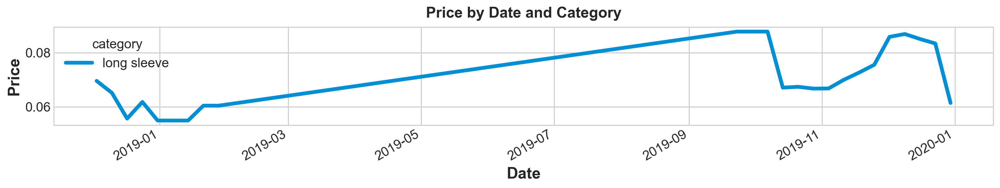

In [1307]:
# Group data by category and date, and calculate the mean price
import pandas as pd
import matplotlib.pyplot as plt
cotton_restock_df = merged_df[(merged_df['fabric'] == 'acrylic') & (merged_df['category'] == 'long sleeve')][['retail', 'release_date', 'price','category']].set_index('release_date')

# Filtrer les données entre janvier 2019 et mai 2019
start_date = '2018-12-01'
end_date = '2019-12-30'
df_filtered = cotton_restock_df.loc[start_date:end_date]
df_filtered.groupby(['release_date', 'category'])['retail'].sum().reset_index()
df_filtered['date']=df_filtered.index
df_filtered['date'] = pd.to_datetime(df_filtered['date'])  # assurez-vous que la colonne est de type datetime
df_filtered['date'] = df_filtered['date'].dt.date  # extrait la date de chaque élément de la colonne
df_filtered.index = pd.to_datetime(df_filtered.index)

df_filtered.head()
pivot_df = df_filtered.pivot_table(index='release_date', columns='category', values='price')

# Plot the data
fig, ax = plt.subplots(figsize=(15, 3))
pivot_df.plot(kind='line', ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Price')
ax.set_title('Price by Date and Category')
plt.show()

In [1162]:

data= acrylic_restock_df

# Convert date column to datetime format and set it as index

data

,acrylic_retail
release_date,
2016-11-28,238
2016-12-05,2778
2016-12-12,786
2016-12-19,99
2016-12-26,74
...,...
2019-12-02,11421
2019-12-09,9271
2019-12-16,2720


In [34]:
from pathlib import Path
from warnings import simplefilter

import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess

simplefilter("ignore")

# Set Matplotlib defaults
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True, figsize=(11, 5))
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
)
%config InlineBackend.figure_format = 'retina'

def seasonal_plot(X, y, period, freq, ax=None):
    if ax is None:
        _, ax = plt.subplots()
    palette = sns.color_palette("husl", n_colors=X[period].nunique(),)
    ax = sns.lineplot(
        x=freq,
        y=y,
        hue=period,
        data=X,
        ci=False,
        ax=ax,
        palette=palette,
        legend=False,
    )
    ax.set_title(f"Seasonal Plot ({period}/{freq})")
    for line, name in zip(ax.lines, X[period].unique()):
        y_ = line.get_ydata()[-1]
        ax.annotate(
            name,
            xy=(1, y_),
            xytext=(6, 0),
            color=line.get_color(),
            xycoords=ax.get_yaxis_transform(),
            textcoords="offset points",
            size=14,
            va="center",
        )
    return ax


def plot_periodogram(ts, detrend='linear', ax=None):
    from scipy.signal import periodogram
    fs = pd.Timedelta("1Y") / pd.Timedelta("1D")
    freqencies, spectrum = periodogram(
        ts,
        fs=fs,
        detrend=detrend,
        window="boxcar",
        scaling='spectrum',
    )
    if ax is None:
        _, ax = plt.subplots()
    ax.step(freqencies, spectrum, color="purple")
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(
        [
            "Annual (1)",
            "Semiannual (2)",
            "Quarterly (4)",
            "Bimonthly (6)",
            "Monthly (12)",
            "Biweekly (26)",
            "Weekly (52)",
            "Semiweekly (104)",
        ],
        rotation=30,
    )
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogram")
    return ax


In [1163]:
X = data.copy()
X.index = pd.to_datetime(data.index)

# days within a week
X["week"] = X.index.week  # the seasonal period (period)

X

,acrylic_retail,week
release_date,,
2016-11-28,238,48
2016-12-05,2778,49
2016-12-12,786,50
2016-12-19,99,51
2016-12-26,74,52
...,...,...
2019-12-02,11421,49
2019-12-09,9271,50
2019-12-16,2720,51


In [1164]:
X = data.copy()
X.index = pd.to_datetime(data.index)
# days within a week
X["day"] = X.index.dayofweek  # the x-axis (freq)
X["week"] = X.index.week  # the seasonal period (period)
X["month"] = X.index.month  # the seasonal period (period)
# days within a year
X["dayofyear"] = X.index.dayofyear
X["year"] = X.index.year
X.head()

,acrylic_retail,day,week,month,dayofyear,year
release_date,,,,,,
2016-11-28,238,0,48,11,333,2016
2016-12-05,2778,0,49,12,340,2016
2016-12-12,786,0,50,12,347,2016
2016-12-19,99,0,51,12,354,2016
2016-12-26,74,0,52,12,361,2016


<Figure size 1100x600 with 0 Axes>

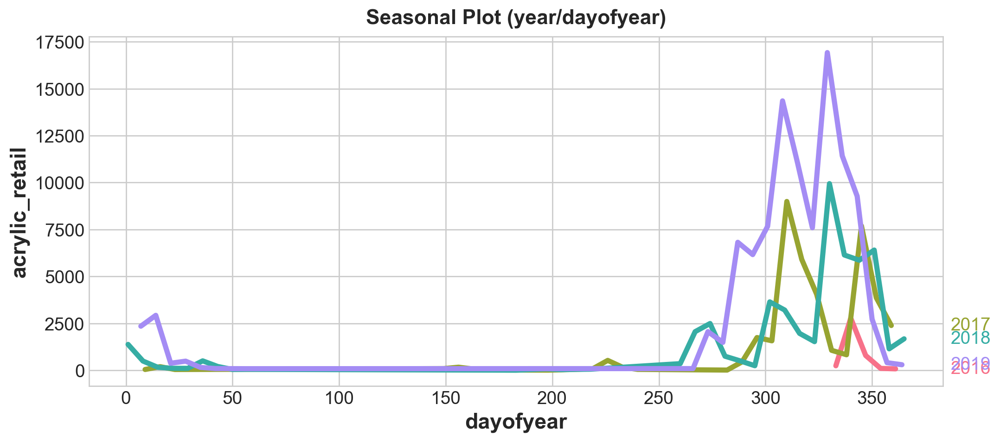

In [1165]:
fig = plt.figure(figsize=(11, 6))
seasonal_plot(X, y="acrylic_retail", period="year", freq="dayofyear", ax=None)
plt.show()

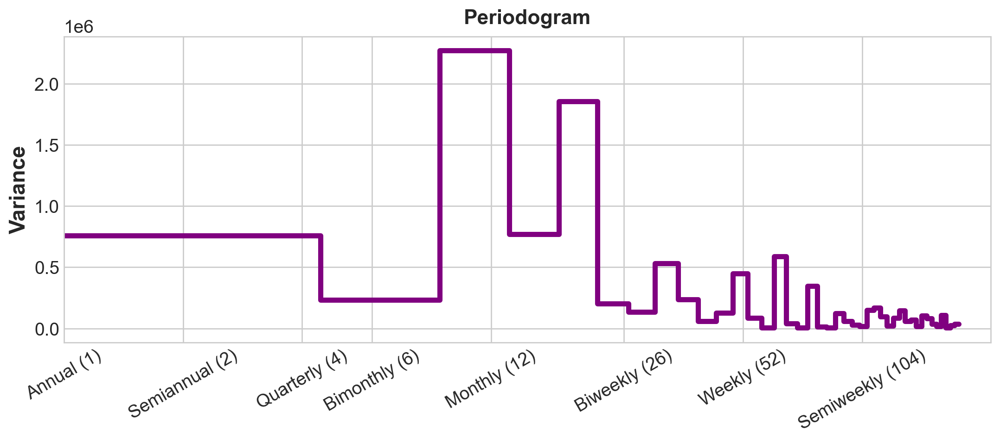

In [1166]:
plot_periodogram(X.acrylic_retail);

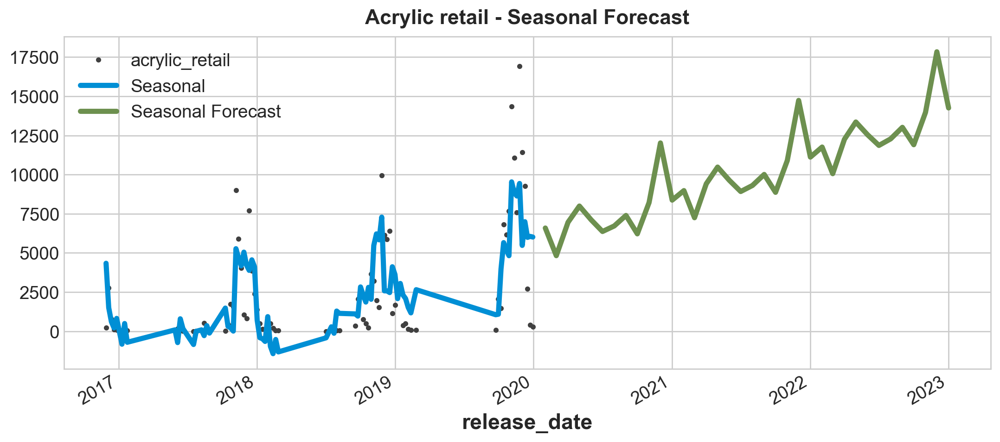

In [1179]:
from statsmodels.tsa.deterministic import CalendarSeasonality, CalendarFourier, DeterministicProcess

index = pd.PeriodIndex(X.index, freq='M')
X.index = index

seasonality = CalendarSeasonality(freq='M', period='A')  # weekly seasonality
fourier = CalendarFourier(freq="M", order=2)  # 2 sin/cos pairs for "A"nnual seasonality

dp = DeterministicProcess(
    index=X.index,
    constant=True,               # dummy feature for bias (y-intercept)
    order=2,                     # trend (order 1 means linear)
    seasonal=True,               # weekly seasonality (indicators)
    additional_terms=[seasonality, fourier],  # annual seasonality (fourier)
    drop=True,                   # drop terms to avoid collinearity
)

X = dp.in_sample()  # create features for dates in tunnel.index
y = data.acrylic_retail
model = LinearRegression(fit_intercept=False)
_ = model.fit(X, y)

y_pred = pd.Series(model.predict(X), index=y.index)
X_fore = dp.out_of_sample(steps=36)
y_fore = pd.Series(model.predict(X_fore), index=X_fore.index)

ax = y.plot(color='0.25', style='.', title="Acrylic retail - Seasonal Forecast")
ax = y_pred.plot(ax=ax, label="Seasonal")
ax = y_fore.plot(ax=ax, label="Seasonal Forecast", color='C3')
_ = ax.legend()


# georgette

In [326]:
list

['acrylic', 'georgette', 'nice', 'cotton', 'lace']

<AxesSubplot:xlabel='release_date'>

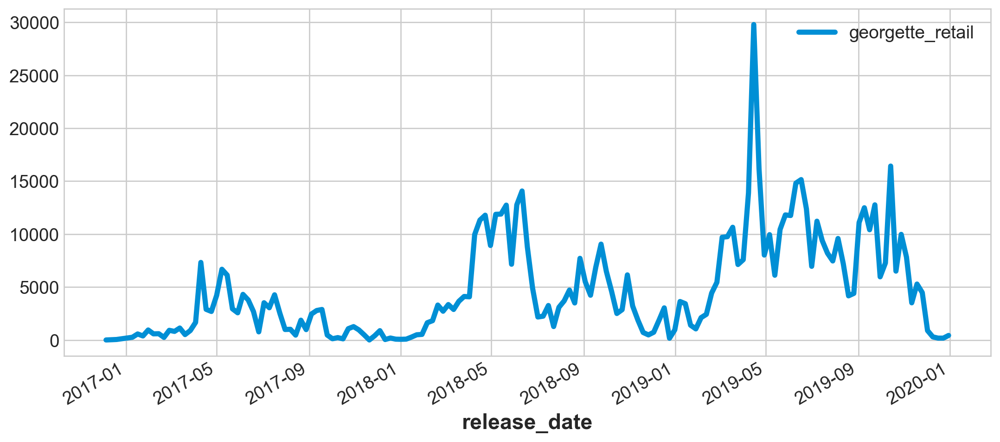

In [1318]:
acrylic_restock_df = df[df['fabric'] == 'georgette'][['retail', 'release_date']].set_index('release_date')
acrylic_restock_df.columns = ['georgette_retail']
acrylic_restock_df = acrylic_restock_df.astype({'georgette_retail': int})
acrylic_restock_df.index = pd.to_datetime(acrylic_restock_df.index)
#acrylic_restock_weekly = acrylic_restock_df.resample('W').sum()
#acrylic_restock_weekly.plot()
acrylic_restock_df = acrylic_restock_df.groupby('release_date').sum()
acrylic_restock_df.plot()

In [1319]:
import pandas as pd
import matplotlib.pyplot as plt
cotton_restock_df = df[df['fabric'] == 'georgette'][['retail', 'release_date','category']].set_index('release_date')

# Filtrer les données entre janvier 2019 et mai 2019
start_date = '2019-03-01'
end_date = '2019-05-30'
df_filtered = cotton_restock_df.loc[start_date:end_date]
df_filtered.groupby(['release_date', 'category'])['retail'].sum().reset_index()
df_filtered['release_date']=df_filtered.index
df_filtered['release_date'] = pd.to_datetime(df_filtered['release_date'])  # assurez-vous que la colonne est de type datetime
df_filtered['release_date'] = df_filtered['release_date'].dt.date  # extrait la date de chaque élément de la colonne
df_filtered.index = pd.to_datetime(df_filtered.index)

df_filtered.head()


,retail,category,release_date
release_date,,,
2019-03-04,8,short sleeves,2019-03-04
2019-03-04,4,short sleeves,2019-03-04
2019-03-04,0,short sleeves,2019-03-04
2019-03-04,46,short sleeves,2019-03-04
2019-03-04,36,short sleeves,2019-03-04


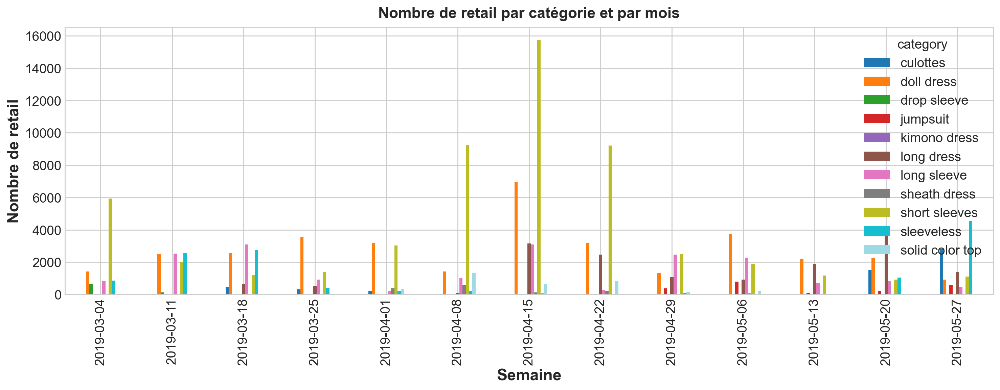

In [1280]:
# Regrouper les données par catégorie et par mois, et calculer le nombre de restocks
grouped = df_filtered.groupby(['category', pd.Grouper(key='release_date')])['retail'].sum()
grouped = grouped.unstack(level=0)

# Créer un colormap avec plus de couleurs
cmap = plt.get_cmap('tab20')

# Tracer le graphique avec les nouvelles couleurs
fig, ax = plt.subplots(figsize=(15, 6))
grouped.plot(kind='bar', ax=ax, colormap=cmap)
ax.set_xlabel('Semaine')
ax.set_ylabel('Nombre de retail')
ax.set_title('Nombre de retail par catégorie et par mois')
plt.show()


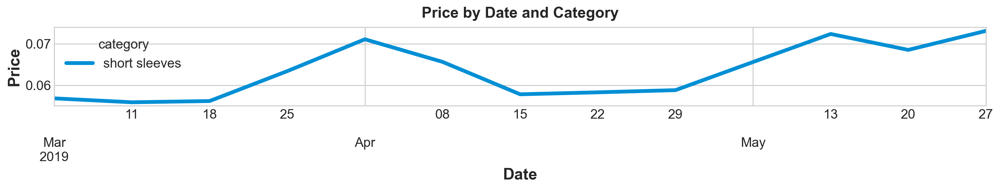

In [534]:
# Group data by category and date, and calculate the mean price
import pandas as pd
import matplotlib.pyplot as plt
cotton_restock_df = merged_df[(merged_df['fabric'] == 'georgette') & (merged_df['category'] == 'short sleeves')][['restock', 'release_date', 'price','category']].set_index('release_date')

# Filtrer les données entre janvier 2019 et mai 2019
start_date = '2019-03-01'
end_date = '2019-05-30'
df_filtered = cotton_restock_df.loc[start_date:end_date]
df_filtered.groupby(['release_date', 'category'])['restock'].sum().reset_index()
df_filtered['date']=df_filtered.index
df_filtered['date'] = pd.to_datetime(df_filtered['date'])  # assurez-vous que la colonne est de type datetime
df_filtered['date'] = df_filtered['date'].dt.date  # extrait la date de chaque élément de la colonne
df_filtered.index = pd.to_datetime(df_filtered.index)

df_filtered.head()
pivot_df = df_filtered.pivot_table(index='release_date', columns='category', values='price')

# Plot the data
fig, ax = plt.subplots(figsize=(15, 3))
pivot_df.plot(kind='line', ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Price')
ax.set_title('Price by Date and Category')
plt.show()

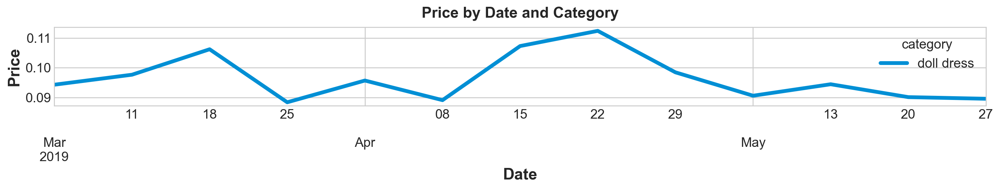

In [536]:
# Group data by category and date, and calculate the mean price
import pandas as pd
import matplotlib.pyplot as plt
cotton_restock_df = merged_df[(merged_df['fabric'] == 'georgette') & (merged_df['category'] == 'doll dress')][['restock', 'release_date', 'price','category']].set_index('release_date')

# Filtrer les données entre janvier 2019 et mai 2019
start_date = '2019-03-01'
end_date = '2019-05-30'
df_filtered = cotton_restock_df.loc[start_date:end_date]
df_filtered.groupby(['release_date', 'category'])['restock'].sum().reset_index()
df_filtered['date']=df_filtered.index
df_filtered['date'] = pd.to_datetime(df_filtered['date'])  # assurez-vous que la colonne est de type datetime
df_filtered['date'] = df_filtered['date'].dt.date  # extrait la date de chaque élément de la colonne
df_filtered.index = pd.to_datetime(df_filtered.index)

df_filtered.head()
pivot_df = df_filtered.pivot_table(index='release_date', columns='category', values='price')

# Plot the data
fig, ax = plt.subplots(figsize=(15, 3))
pivot_df.plot(kind='line', ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Price')
ax.set_title('Price by Date and Category')
plt.show()

Il y a un peak en avril pour les restocks de short sleeves et doll dress, short sleeves a eu une baisse de prix mais on ignore la raison pour doll dress. 

In [1320]:
data= acrylic_restock_df
X = data.copy()
X.index = pd.to_datetime(data.index)

# days within a week
X["week"] = X.index.week  # the seasonal period (period)
X = data.copy()
X.index = pd.to_datetime(data.index)
# days within a week
X["day"] = X.index.dayofweek  # the x-axis (freq)
X["week"] = X.index.week  # the seasonal period (period)
X["month"] = X.index.month  # the seasonal period (period)
# days within a year
X["dayofyear"] = X.index.dayofyear
X["year"] = X.index.year
X

,georgette_retail,day,week,month,dayofyear,year
release_date,,,,,,
2016-12-05,10,0,49,12,340,2016
2016-12-19,56,0,51,12,354,2016
2017-01-09,266,0,2,1,9,2017
2017-01-16,577,0,3,1,16,2017
2017-01-23,388,0,4,1,23,2017
...,...,...,...,...,...,...
2019-12-02,898,0,49,12,336,2019
2019-12-09,302,0,50,12,343,2019
2019-12-16,184,0,51,12,350,2019


<Figure size 1100x600 with 0 Axes>

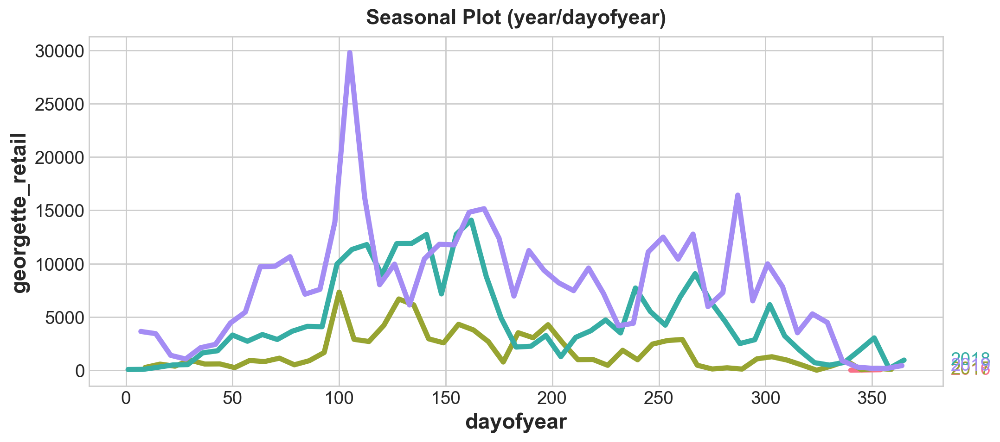

In [1282]:
fig = plt.figure(figsize=(11, 6))
seasonal_plot(X, y="georgette_retail", period="year", freq="dayofyear", ax=None)
plt.show()

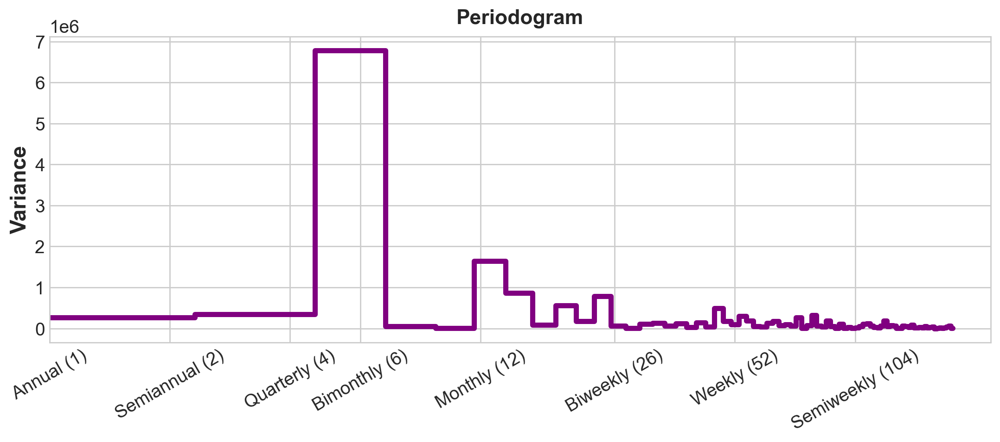

In [1321]:
plot_periodogram(X.georgette_retail);

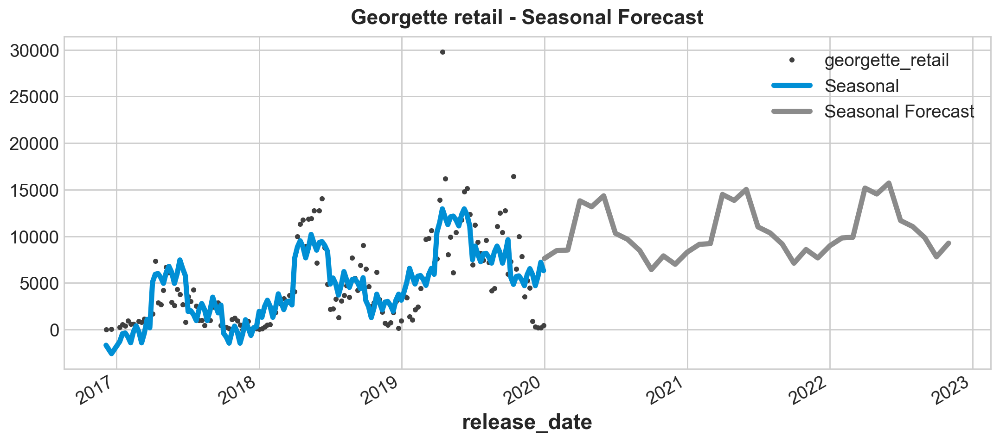

In [1324]:
from statsmodels.tsa.deterministic import CalendarSeasonality, CalendarFourier, DeterministicProcess

index = pd.PeriodIndex(X.index, freq='M')
X.index = index

seasonality = CalendarSeasonality(freq='Q', period='A')  # weekly seasonality
fourier = CalendarFourier(freq="M", order=55)  # 2 sin/cos pairs for "A"nnual seasonality

dp = DeterministicProcess(
    index=X.index,
    constant=True,               # dummy feature for bias (y-intercept)
    order=1,                     # trend (order 1 means linear)
    seasonal=True,               # weekly seasonality (indicators)
    additional_terms=[seasonality, fourier],  # annual seasonality (fourier)
    drop=True,                   # drop terms to avoid collinearity
)

X = dp.in_sample()  # create features for dates in tunnel.index
y = data.georgette_retail
model = LinearRegression(fit_intercept=False)
_ = model.fit(X, y)

y_pred = pd.Series(model.predict(X), index=y.index)
X_fore = dp.out_of_sample(steps=35)
y_fore = pd.Series(model.predict(X_fore), index=X_fore.index)

ax = y.plot(color='0.25', style='.', title="Georgette retail - Seasonal Forecast")
ax = y_pred.plot(ax=ax, label="Seasonal")
ax = y_fore.plot(ax=ax, label="Seasonal Forecast", color='C4')
_ = ax.legend()


# Nice forecast

In [354]:
list

['acrylic', 'georgette', 'nice', 'cotton', 'lace']

<AxesSubplot:xlabel='release_date'>

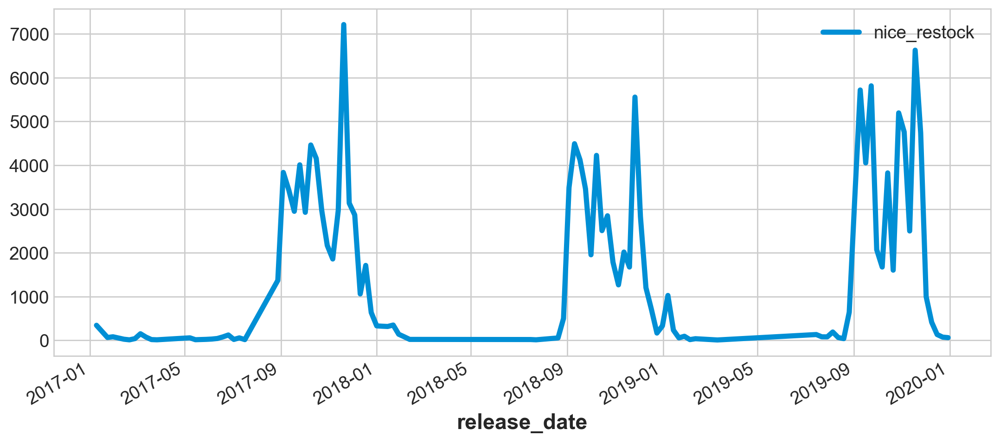

In [355]:
acrylic_restock_df = df[df['fabric'] == 'nice'][['restock', 'release_date']].set_index('release_date')
acrylic_restock_df.columns = ['nice_restock']
acrylic_restock_df = acrylic_restock_df.astype({'nice_restock': int})
acrylic_restock_df.index = pd.to_datetime(acrylic_restock_df.index)
#acrylic_restock_weekly = acrylic_restock_df.resample('W').sum()
#acrylic_restock_weekly.plot()
acrylic_restock_df = acrylic_restock_df.groupby('release_date').sum()
acrylic_restock_df.plot()

<Figure size 1100x600 with 0 Axes>

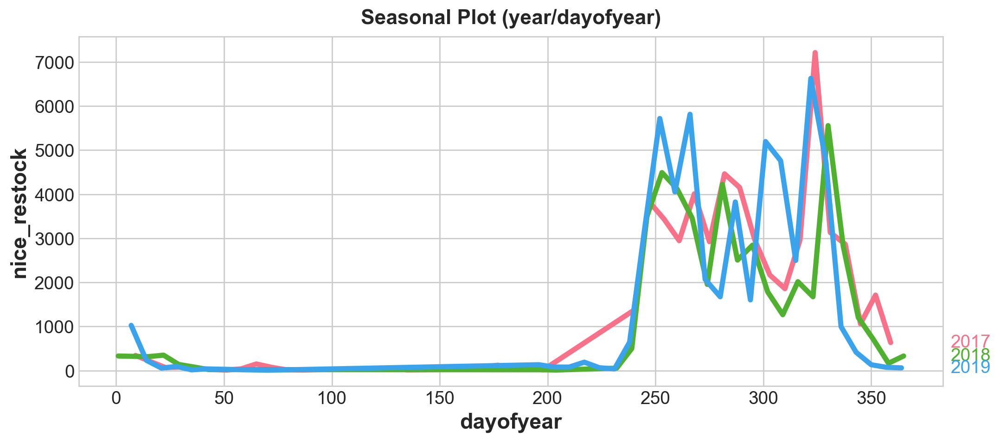

In [356]:
data= acrylic_restock_df
X = data.copy()
X.index = pd.to_datetime(data.index)

# days within a week
X["week"] = X.index.week  # the seasonal period (period)
X = data.copy()
X.index = pd.to_datetime(data.index)
# days within a week
X["day"] = X.index.dayofweek  # the x-axis (freq)
X["week"] = X.index.week  # the seasonal period (period)
X["month"] = X.index.month  # the seasonal period (period)
# days within a year
X["dayofyear"] = X.index.dayofyear
X["year"] = X.index.year
fig = plt.figure(figsize=(11, 6))
seasonal_plot(X, y="nice_restock", period="year", freq="dayofyear", ax=None)
plt.show()

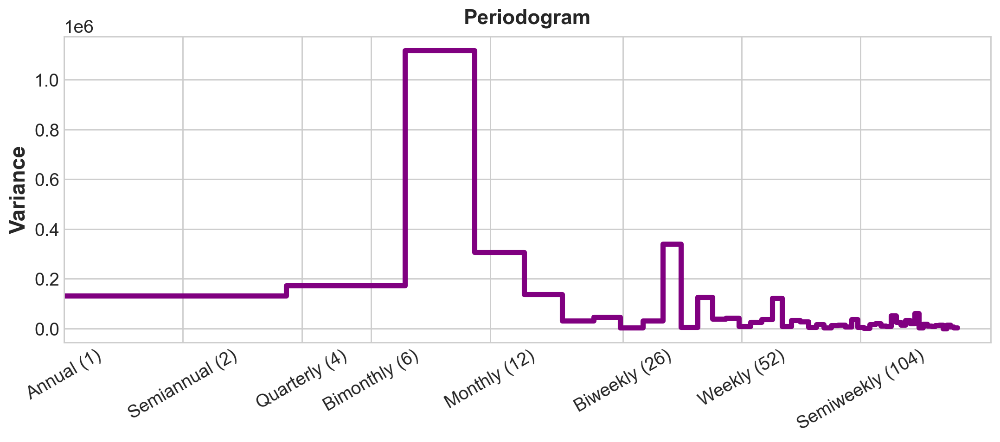

In [358]:
plot_periodogram(X.nice_restock);

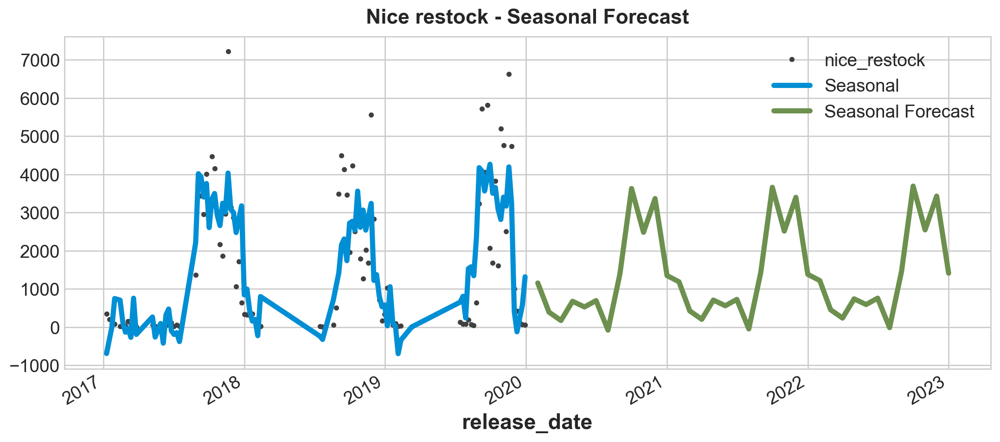

In [363]:
from statsmodels.tsa.deterministic import CalendarSeasonality, CalendarFourier, DeterministicProcess

index = pd.PeriodIndex(X.index, freq='M')
X.index = index

seasonality = CalendarSeasonality(freq='M', period='A')  # weekly seasonality
fourier = CalendarFourier(freq="M", order=25)  # 2 sin/cos pairs for "A"nnual seasonality

dp = DeterministicProcess(
    index=X.index,
    constant=True,               # dummy feature for bias (y-intercept)
    order=1,                     # trend (order 1 means linear)
    seasonal=True,               # weekly seasonality (indicators)
    additional_terms=[seasonality, fourier],  # annual seasonality (fourier)
    drop=True,                   # drop terms to avoid collinearity
)

X = dp.in_sample()  # create features for dates in tunnel.index
y = data.nice_restock
model = LinearRegression(fit_intercept=False)
_ = model.fit(X, y)

y_pred = pd.Series(model.predict(X), index=y.index)
X_fore = dp.out_of_sample(steps=36)
y_fore = pd.Series(model.predict(X_fore), index=X_fore.index)

ax = y.plot(color='0.25', style='.', title="Nice restock - Seasonal Forecast")
ax = y_pred.plot(ax=ax, label="Seasonal")
ax = y_fore.plot(ax=ax, label="Seasonal Forecast", color='C3')
_ = ax.legend()


# Lace

In [408]:
list

['acrylic', 'georgette', 'nice', 'cotton', 'lace']

<AxesSubplot:xlabel='release_date'>

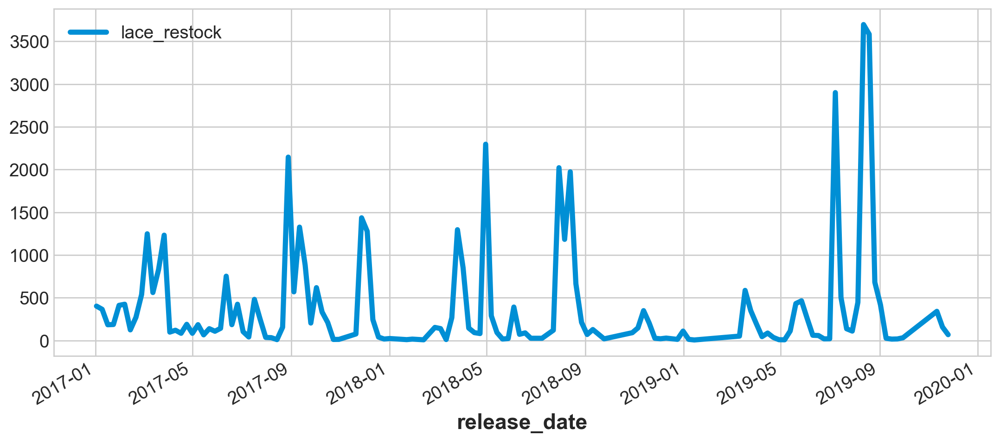

In [409]:
acrylic_restock_df = df[df['fabric'] == 'lace'][['restock', 'release_date']].set_index('release_date')
acrylic_restock_df.columns = ['lace_restock']
acrylic_restock_df = acrylic_restock_df.astype({'lace_restock': int})
acrylic_restock_df.index = pd.to_datetime(acrylic_restock_df.index)
#acrylic_restock_weekly = acrylic_restock_df.resample('W').sum()
#acrylic_restock_weekly.plot()
acrylic_restock_df = acrylic_restock_df.groupby('release_date').sum()
acrylic_restock_df.plot()

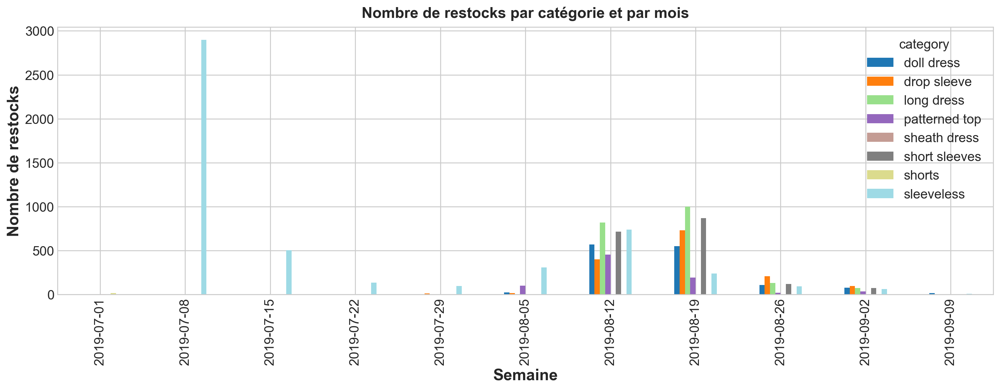

In [486]:

import pandas as pd
import matplotlib.pyplot as plt
cotton_restock_df = df[df['fabric'] == 'lace'][['restock', 'release_date','category']].set_index('release_date')

# Filtrer les données entre janvier 2019 et mai 2019
start_date = '2019-07-01'
end_date = '2019-09-09'
df_filtered = cotton_restock_df.loc[start_date:end_date]
df_filtered.groupby(['release_date', 'category'])['restock'].sum().reset_index()
df_filtered['date']=df_filtered.index
df_filtered['date'] = pd.to_datetime(df_filtered['date'])  # assurez-vous que la colonne est de type datetime
df_filtered['date'] = df_filtered['date'].dt.date  # extrait la date de chaque élément de la colonne
df_filtered.index = pd.to_datetime(df_filtered.index)

df_filtered.head()


# Regrouper les données par catégorie et par mois, et calculer le nombre de restocks
grouped = df_filtered.groupby(['category', pd.Grouper(key='date')])['restock'].sum()
grouped = grouped.unstack(level=0)

# Créer un colormap avec plus de couleurs
cmap = plt.get_cmap('tab20')

# Tracer le graphique avec les nouvelles couleurs
fig, ax = plt.subplots(figsize=(15, 6))
grouped.plot(kind='bar', ax=ax, colormap=cmap)
ax.set_xlabel('Semaine')
ax.set_ylabel('Nombre de restocks')
ax.set_title('Nombre de restocks par catégorie et par mois')
plt.show()


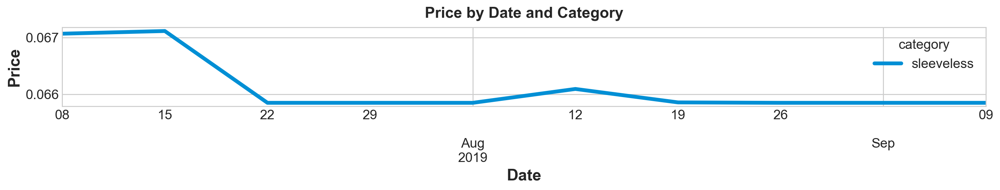

In [507]:
# Group data by category and date, and calculate the mean price
import pandas as pd
import matplotlib.pyplot as plt
cotton_restock_df = merged_df[(merged_df['fabric'] == 'lace') & (merged_df['category'] == 'sleeveless')][['restock', 'release_date', 'price','category']].set_index('release_date')

# Filtrer les données entre janvier 2019 et mai 2019
start_date = '2019-05-01'
end_date = '2019-09-26'
df_filtered = cotton_restock_df.loc[start_date:end_date]
df_filtered.groupby(['release_date', 'category'])['restock'].sum().reset_index()
df_filtered['date']=df_filtered.index
df_filtered['date'] = pd.to_datetime(df_filtered['date'])  # assurez-vous que la colonne est de type datetime
df_filtered['date'] = df_filtered['date'].dt.date  # extrait la date de chaque élément de la colonne
df_filtered.index = pd.to_datetime(df_filtered.index)

df_filtered.head()
pivot_df = df_filtered.pivot_table(index='release_date', columns='category', values='price')

# Plot the data
fig, ax = plt.subplots(figsize=(15, 3))
pivot_df.plot(kind='line', ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Price')
ax.set_title('Price by Date and Category')
plt.show()

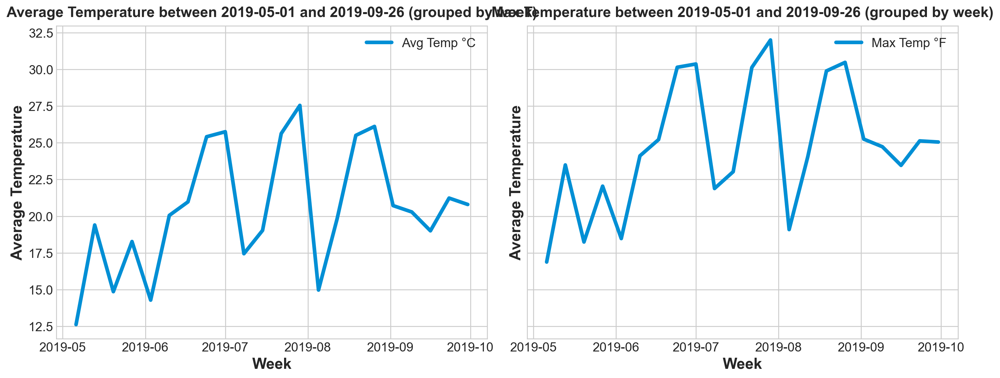

In [532]:
# filter the data between 'start_date' and 'end_date'
start_date = '2019-05-01'
end_date = '2019-09-26'
df_filtered = df3.loc[(df3['date'] >= start_date) & (df3['date'] <= end_date)]

# group the data by week and calculate the mean and max temperature
df_grouped = df_filtered.groupby(pd.Grouper(key='date', freq='W-MON'))[['avg_temp', 'max_temp']].mean()

# create the figure and axes objects
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6), sharey=True)

# plot the average temperature in Celsius in the first subplot
ax1.plot(df_grouped.index, df_grouped['avg_temp'], label='Avg Temp °C')
ax1.set_xlabel('Week')
ax1.set_ylabel('Average Temperature')
ax1.set_title('Average Temperature between {} and {} (grouped by week)'.format(start_date, end_date))

# plot the max temperature in Fahrenheit in the second subplot
ax2.plot(df_grouped.index, df_grouped['max_temp'], label='Max Temp °F')
ax2.set_xlabel('Week')
ax2.set_ylabel('Average Temperature')
ax2.set_title('Max Temperature between {} and {} (grouped by week)'.format(start_date, end_date))

# show the legend for both subplots
ax1.legend()
ax2.legend()

# show the plot
plt.show()


Il y a un peak en juillet et aout pour des ventes de sleeveless et différent type de vetements, due à la promotion

<Figure size 1100x600 with 0 Axes>

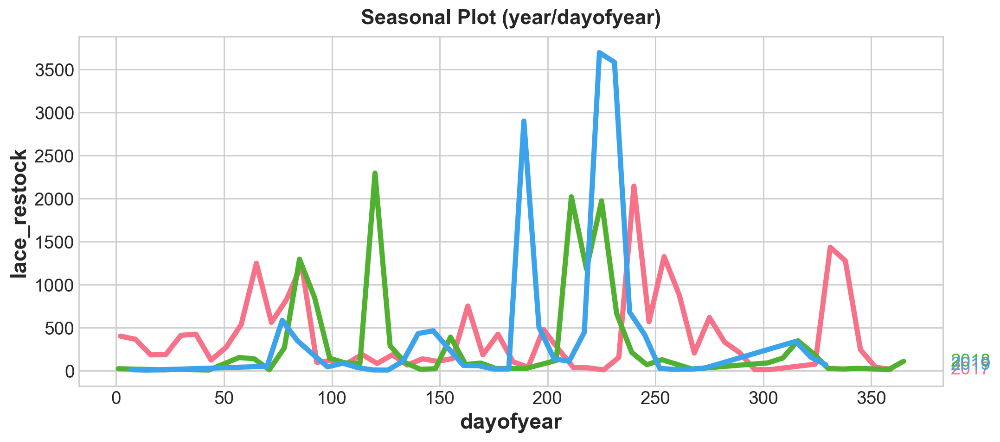

In [410]:
data= acrylic_restock_df
X = data.copy()
X.index = pd.to_datetime(data.index)

# days within a week
X["week"] = X.index.week  # the seasonal period (period)
X = data.copy()
X.index = pd.to_datetime(data.index)
# days within a week
X["day"] = X.index.dayofweek  # the x-axis (freq)
X["week"] = X.index.week  # the seasonal period (period)
X["month"] = X.index.month  # the seasonal period (period)
# days within a year
X["dayofyear"] = X.index.dayofyear
X["year"] = X.index.year
fig = plt.figure(figsize=(11, 6))
seasonal_plot(X, y="lace_restock", period="year", freq="dayofyear", ax=None)
plt.show()

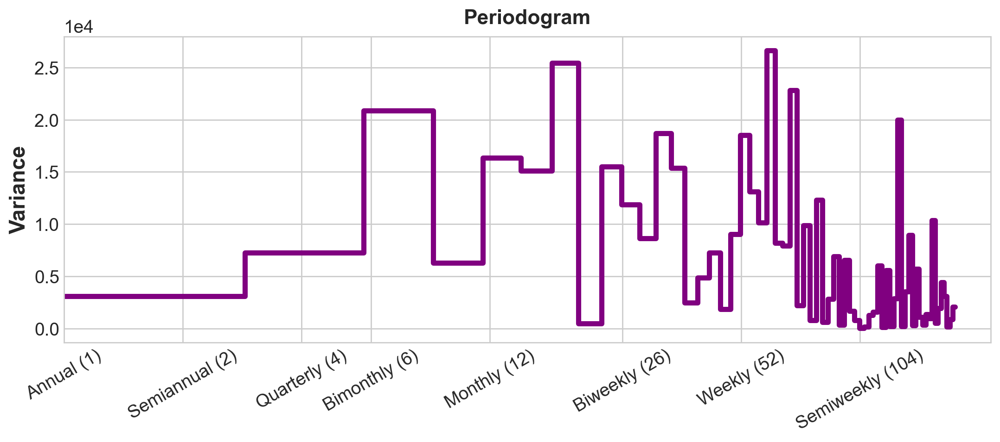

In [411]:
plot_periodogram(X.lace_restock);

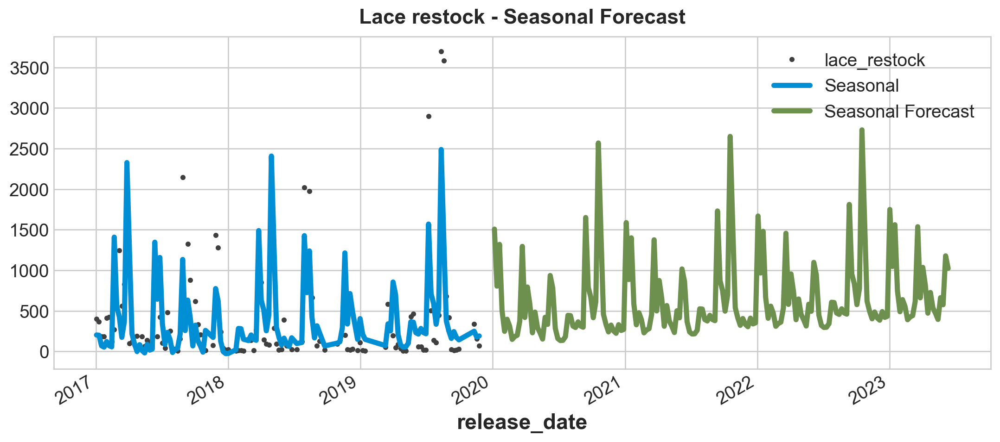

In [416]:
from statsmodels.tsa.deterministic import CalendarSeasonality, CalendarFourier, DeterministicProcess

index = pd.PeriodIndex(X.index, freq='W')
X.index = index

seasonality = CalendarSeasonality(freq='H', period='D')  # weekly seasonality
fourier = CalendarFourier(freq="W", order=25)  # 2 sin/cos pairs for "A"nnual seasonality

dp = DeterministicProcess(
    index=X.index,
    constant=True,               # dummy feature for bias (y-intercept)
    order=1,                     # trend (order 1 means linear)
    seasonal=True,               # weekly seasonality (indicators)
    additional_terms=[seasonality, fourier],  # annual seasonality (fourier)
    drop=True,                   # drop terms to avoid collinearity
)

X = dp.in_sample()  # create features for dates in tunnel.index
y = data.lace_restock
model = LinearRegression(fit_intercept=False)
_ = model.fit(X, y)

y_pred = pd.Series(model.predict(X), index=y.index)
X_fore = dp.out_of_sample(steps=180)
y_fore = pd.Series(model.predict(X_fore), index=X_fore.index)

ax = y.plot(color='0.25', style='.', title="Lace restock - Seasonal Forecast")
ax = y_pred.plot(ax=ax, label="Seasonal")
ax = y_fore.plot(ax=ax, label="Seasonal Forecast", color='C3')
_ = ax.legend()


# Cotton

<AxesSubplot:xlabel='release_date'>

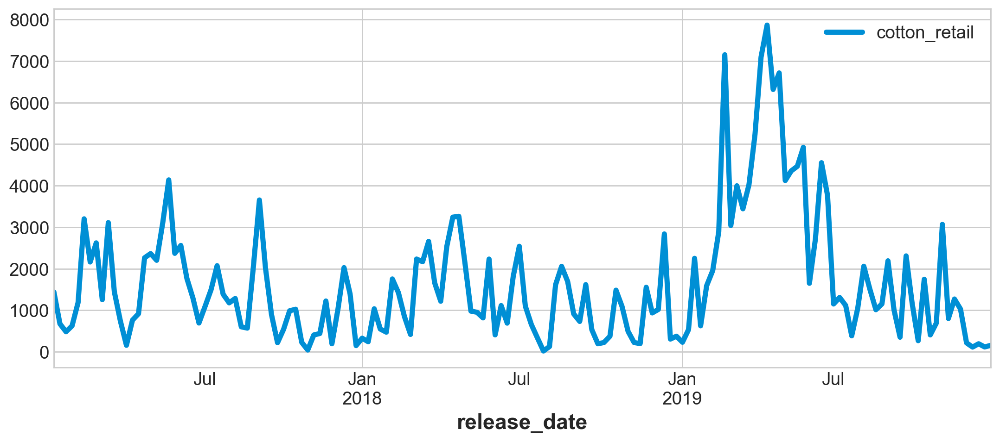

In [1311]:
acrylic_restock_df = df[df['fabric'] == 'cotton'][['retail', 'release_date']].set_index('release_date')
acrylic_restock_df.columns = ['cotton_retail']
acrylic_restock_df = acrylic_restock_df.astype({'cotton_retail': int})
acrylic_restock_df.index = pd.to_datetime(acrylic_restock_df.index)
#acrylic_restock_weekly = acrylic_restock_df.resample('W').sum()
#acrylic_restock_weekly.plot()
acrylic_restock_df = acrylic_restock_df.groupby('release_date').sum()
acrylic_restock_df.plot()

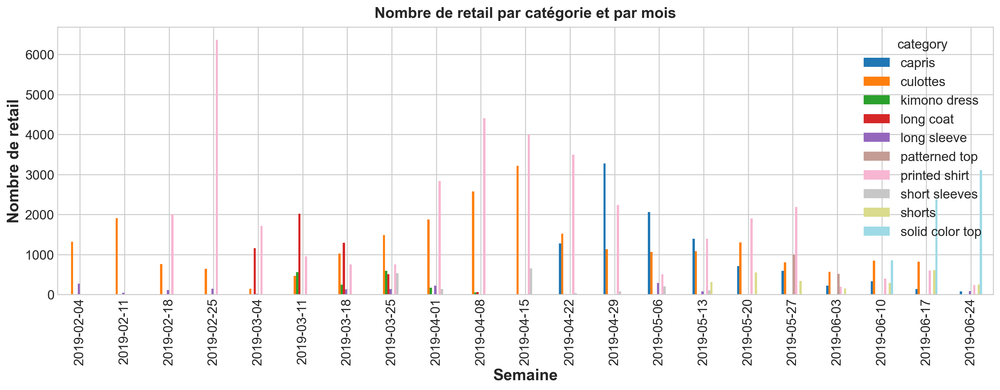

In [1312]:

import pandas as pd
import matplotlib.pyplot as plt
cotton_restock_df = df[df['fabric'] == 'cotton'][['retail', 'release_date','category']].set_index('release_date')

# Filtrer les données entre janvier 2019 et mai 2019
start_date = '2019-02-01'
end_date = '2019-06-30'
df_filtered = cotton_restock_df.loc[start_date:end_date]
df_filtered.groupby(['release_date', 'category'])['retail'].sum().reset_index()
df_filtered['date']=df_filtered.index
df_filtered['date'] = pd.to_datetime(df_filtered['date'])  # assurez-vous que la colonne est de type datetime
df_filtered['date'] = df_filtered['date'].dt.date  # extrait la date de chaque élément de la colonne
df_filtered.index = pd.to_datetime(df_filtered.index)

df_filtered.head()


# Regrouper les données par catégorie et par mois, et calculer le nombre de restocks
grouped = df_filtered.groupby(['category', pd.Grouper(key='date')])['retail'].sum()
grouped = grouped.unstack(level=0)

# Créer un colormap avec plus de couleurs
cmap = plt.get_cmap('tab20')

# Tracer le graphique avec les nouvelles couleurs
fig, ax = plt.subplots(figsize=(15, 6))
grouped.plot(kind='bar', ax=ax, colormap=cmap)
ax.set_xlabel('Semaine')
ax.set_ylabel('Nombre de retail')
ax.set_title('Nombre de retail par catégorie et par mois')
plt.show()


<Figure size 1100x600 with 0 Axes>

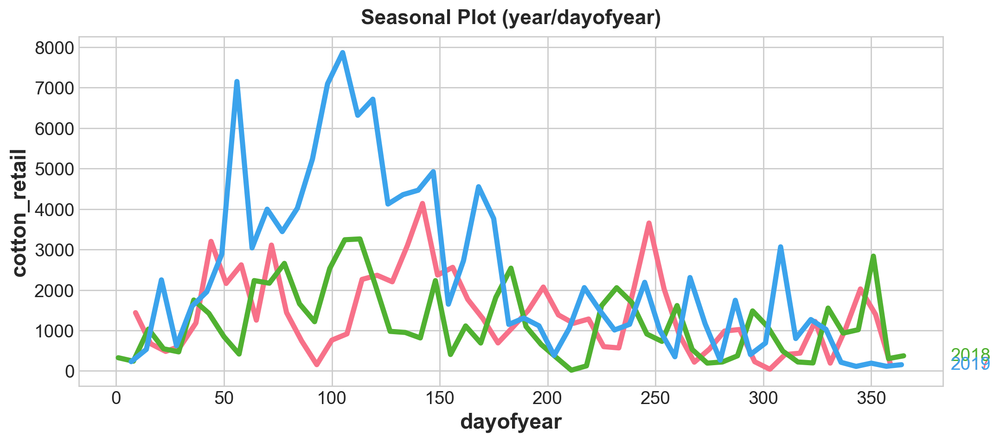

In [1313]:
data= acrylic_restock_df
X = data.copy()
X.index = pd.to_datetime(data.index)

# days within a week
X["week"] = X.index.week  # the seasonal period (period)
X = data.copy()
X.index = pd.to_datetime(data.index)
# days within a week
X["day"] = X.index.dayofweek  # the x-axis (freq)
X["week"] = X.index.week  # the seasonal period (period)
X["month"] = X.index.month  # the seasonal period (period)
# days within a year
X["dayofyear"] = X.index.dayofyear
X["year"] = X.index.year
fig = plt.figure(figsize=(11, 6))
seasonal_plot(X, y="cotton_retail", period="year", freq="dayofyear", ax=None)
plt.show()

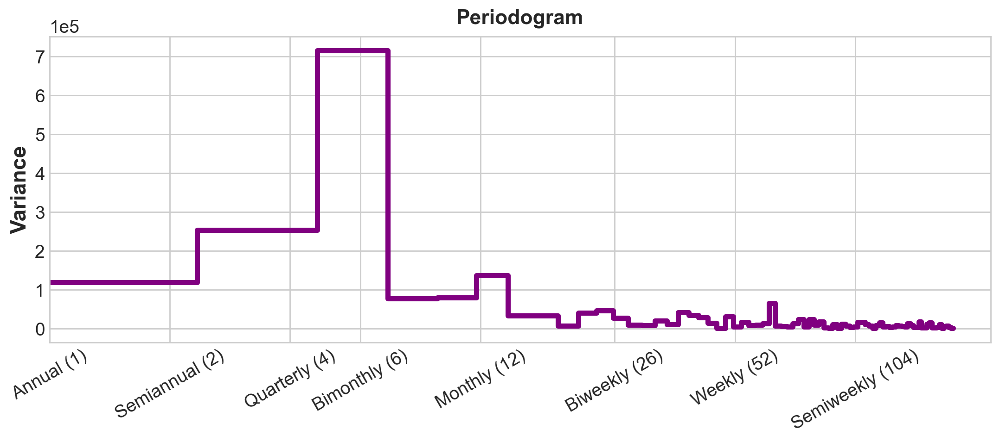

In [1314]:
plot_periodogram(X.cotton_retail);

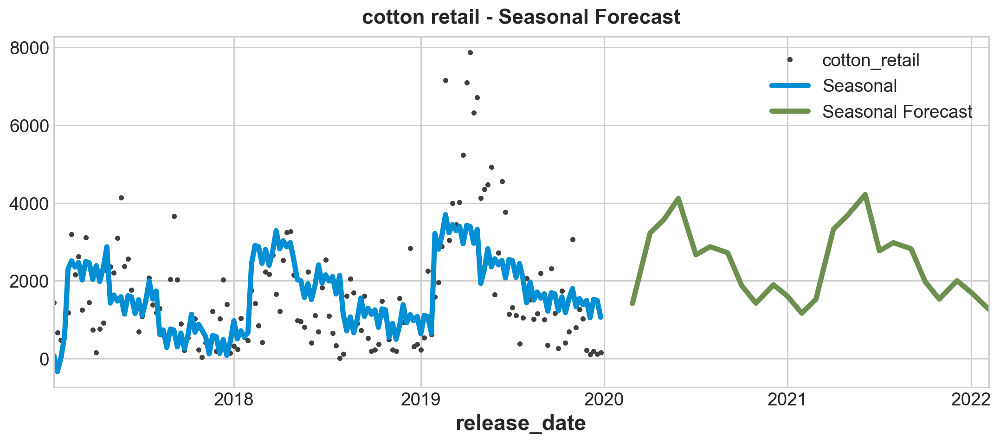

In [1317]:
from statsmodels.tsa.deterministic import CalendarSeasonality, CalendarFourier, DeterministicProcess

index = pd.PeriodIndex(X.index, freq='M')
X.index = index

seasonality = CalendarSeasonality(freq='Q', period='A')  # weekly seasonality
fourier = CalendarFourier(freq="M", order=5)  # 2 sin/cos pairs for "A"nnual seasonality

dp = DeterministicProcess(
    index=X.index,
    constant=True,               # dummy feature for bias (y-intercept)
    order=1,                     # trend (order 1 means linear)
    seasonal=True,               # weekly seasonality (indicators)
    additional_terms=[seasonality, fourier],  # annual seasonality (fourier)
    drop=True,                   # drop terms to avoid collinearity
)

X = dp.in_sample()  # create features for dates in tunnel.index
y = data.cotton_retail
model = LinearRegression(fit_intercept=False)
_ = model.fit(X, y)

y_pred = pd.Series(model.predict(X), index=y.index)
X_fore = dp.out_of_sample(steps=24)
y_fore = pd.Series(model.predict(X_fore), index=X_fore.index)

ax = y.plot(color='0.25', style='.', title="cotton retail - Seasonal Forecast")
ax = y_pred.plot(ax=ax, label="Seasonal")
ax = y_fore.plot(ax=ax, label="Seasonal Forecast", color='C3')
_ = ax.legend()


In [499]:
import pandas as pd
import matplotlib.pyplot as plt
cotton_restock_df = merged_df[(merged_df['fabric'] == 'cotton') & (merged_df['category'] == 'printed shirt')][['restock', 'release_date', 'price','category']].set_index('release_date')

# Filtrer les données entre janvier 2019 et mai 2019
start_date = '2019-02-01'
end_date = '2019-06-30'
df_filtered = cotton_restock_df.loc[start_date:end_date]
df_filtered.groupby(['release_date', 'category'])['restock'].sum().reset_index()
df_filtered['date']=df_filtered.index
df_filtered['date'] = pd.to_datetime(df_filtered['date'])  # assurez-vous que la colonne est de type datetime
df_filtered['date'] = df_filtered['date'].dt.date  # extrait la date de chaque élément de la colonne
df_filtered.index = pd.to_datetime(df_filtered.index)

df_filtered.head()

,restock,price,category,date
release_date,,,,
2019-02-18,28,0.065937,printed shirt,2019-02-18
2019-02-18,66,0.043951,printed shirt,2019-02-18
2019-02-18,25,0.065937,printed shirt,2019-02-18
2019-02-18,32,0.065937,printed shirt,2019-02-18
2019-02-18,98,0.047947,printed shirt,2019-02-18


# Evaluation restock vs vente

In [30]:
df1=merged_df[['release_date','retail','restock','category','price']]
# regrouper les lignes par category et calculer la somme de retail
df_grouped = df.groupby('category')['retail'].sum()

# trier en ordre décroissant et afficher les résultats
df_grouped = df_grouped.sort_values(ascending=False)
df_grouped

category
long sleeve        830933
culottes           806344
doll dress         362182
sleeveless         316785
short sleeves      259584
solid color top    251670
long dress         251431
kimono dress       197646
trapeze dress      135618
patterned top      132744
drop sleeve        123473
long coat          115453
medium coat         98870
printed shirt       80159
jumpsuit            64656
short coat          63604
sheath dress        57823
maxi                43310
short cardigan      38891
gitana skirt        31845
capris              29914
miniskirt           29629
medium cardigan     27039
shorts              22615
shirt dress         16982
long duster         15368
long cardigan       13617
Name: retail, dtype: int64

In [31]:
df1=merged_df[['release_date','retail','restock','category','price']]
culottes_df = df1[df1["category"] == "culottes"]

# Créer un DataFrame avec uniquement les données de la catégorie "long sleeve"
long_sleeve_df = df1[df1["category"] == "long sleeve"]

culottes_df = culottes_df.groupby('release_date').agg({'retail': 'sum', 'restock': 'sum', 'price': 'mean'})
culottes_df.head()

,retail,restock,price
release_date,,,
2016-11-28,41,32,0.043951
2016-12-05,353,503,0.043951
2016-12-12,196,276,0.055860
2016-12-19,494,555,0.069171
2016-12-26,431,310,0.069602


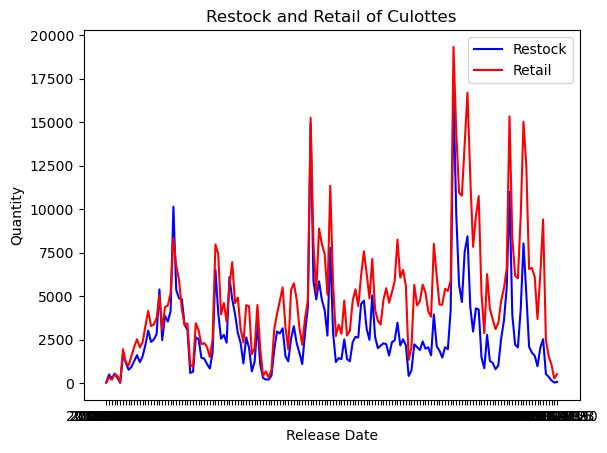

In [32]:
# Créer un DataFrame avec uniquement les données de la catégorie "culottes"

import matplotlib.pyplot as plt

# Create a figure and axis object
fig, ax = plt.subplots()

# Plot restock as a blue line
ax.plot(culottes_df.index, culottes_df["restock"], color='blue', label='Restock')

# Plot retail as a red line
ax.plot(culottes_df.index, culottes_df["retail"], color='red', label='Retail')

# Add title and axis labels
ax.set_title('Restock and Retail of Culottes')
ax.set_xlabel('Release Date')
ax.set_ylabel('Quantity')

# Add legend
ax.legend()

# Show the plot
plt.show()


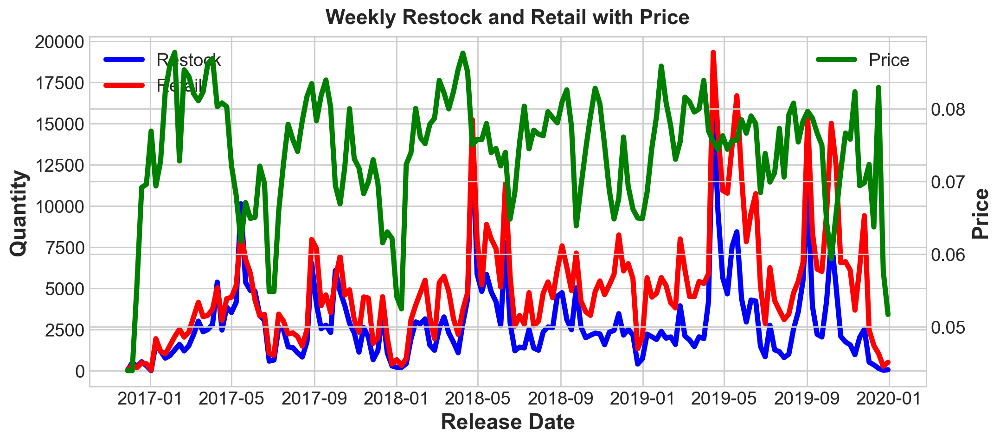

In [1060]:
import pandas as pd
import matplotlib.pyplot as plt

# 按周分组
culotte_pre_weekly = culottes_df

# 创建一个figure和一个axis对象
fig, ax = plt.subplots()

# 绘制“Restock”和“Retail”折线图
ax.plot(culotte_pre_weekly.index, culotte_pre_weekly["restock"], color='blue', label='Restock')
ax.plot(culotte_pre_weekly.index, culotte_pre_weekly["retail"], color='red', label='Retail')

# 创建第二个axis对象，共享x轴
ax2 = ax.twinx()

# 绘制“Price”折线图
ax2.plot(culotte_pre_weekly.index, culotte_pre_weekly["price"], color='green', label='Price')

# 添加标题和轴标签
ax.set_title('Weekly Restock and Retail with Price')
ax.set_xlabel('Release Date')
ax.set_ylabel('Quantity')
ax2.set_ylabel('Price')

# 添加图例
ax.legend(loc='upper left')
ax2.legend(loc='upper right')

# 显示图形
plt.show()


In [1047]:
print('retail vs restock',culottes_df['retail'].corr(culottes_df['restock']))
print('retail vs price',culottes_df['retail'].corr(culottes_df['price']))
#Le prix n'a pas de forte corrélation avec retail

retail vs restock 0.8662244496934584
retail vs price 0.143379840768215


Le réapprovisionnement d'un article populaire dans l'industrie de la fast fashion peut avoir plusieurs impacts environnementaux. Voici quelques exemples:

Augmentation de la production : Le réapprovisionnement d'un article populaire signifie généralement produire davantage, ce qui peut entraîner une augmentation de la consommation d'énergie, d'eau et des émissions de gaz à effet de serre associées au processus de fabrication.

Augmentation du transport : Le réapprovisionnement d'un article peut également nécessiter l'expédition des produits supplémentaires de l'usine de fabrication au centre de distribution, puis aux magasins de détail, ce qui peut augmenter les émissions de carbone associées au transport.

Augmentation des déchets : Les entreprises de fast fashion sont connues pour leur rotation rapide des styles, et le réapprovisionnement des articles populaires ne fait qu'ajouter à ce cycle. Lorsque les styles sortent de la mode ou sont surproduits, ils finissent souvent dans des décharges ou des incinérateurs, créant ainsi des déchets supplémentaires.

Dans l'ensemble, le réapprovisionnement d'articles populaires dans l'industrie de la fast fashion peut avoir un impact négatif sur l'environnement, en particulier en ce qui concerne l'augmentation de la production, du transport et des déchets.

<Figure size 1100x600 with 0 Axes>

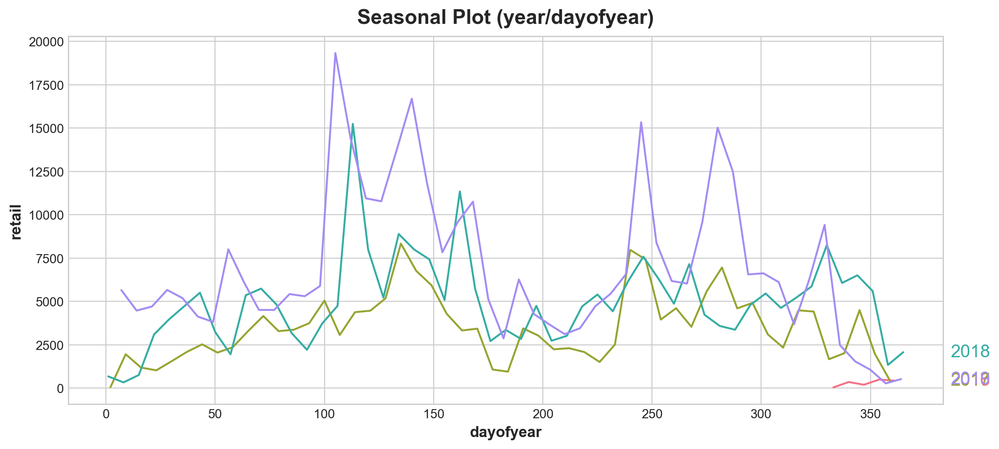

In [35]:
data= culottes_df
X = data.copy()
X.index = pd.to_datetime(data.index)

# days within a week
X["week"] = X.index.week  # the seasonal period (period)
X = data.copy()
X.index = pd.to_datetime(data.index)
# days within a week
X["day"] = X.index.dayofweek  # the x-axis (freq)
X["week"] = X.index.week  # the seasonal period (period)
X["month"] = X.index.month  # the seasonal period (period)
# days within a year
X["dayofyear"] = X.index.dayofyear
X["year"] = X.index.year
fig = plt.figure(figsize=(11, 6))
seasonal_plot(X, y="retail", period="year", freq="dayofyear", ax=None)
plt.show()

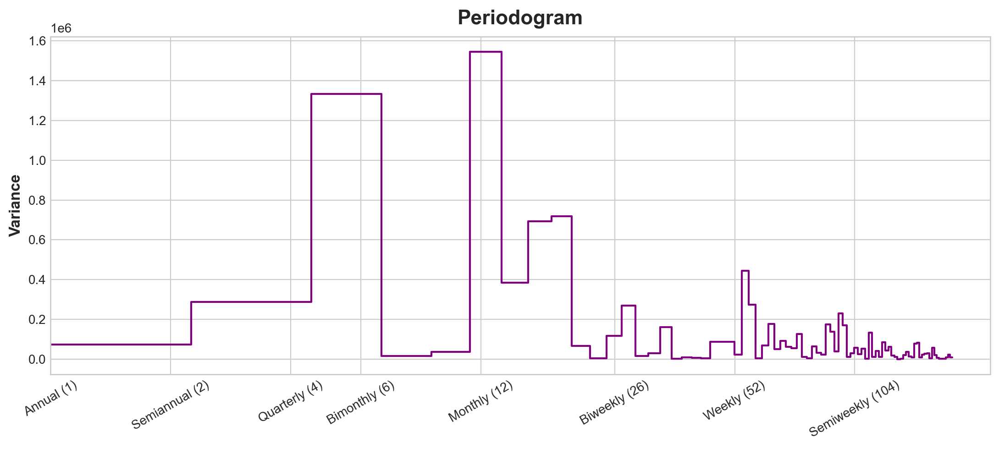

In [36]:
plot_periodogram(X.retail);

In [41]:


# group data by month and calculate sum for retail and restock, and mean for price

culottes_df.index = pd.to_datetime(culottes_df.index)

monthly_data = culottes_df.groupby(pd.Grouper(freq='M')).agg({'retail': 'sum', 'restock': 'sum', 'price': 'mean'})

# print the grouped data
monthly_data.head()


,retail,restock,price
release_date,,,
2016-11-30,41,32,0.043951
2016-12-31,1474,1644,0.059646
2017-01-31,5765,4554,0.077537
2017-02-28,9023,5637,0.082594
2017-03-31,14103,10110,0.082923


In [42]:
train_size = int(len(monthly_data) * 0.7)
train, test = monthly_data.iloc[:train_size,:], monthly_data.iloc[train_size:,:]

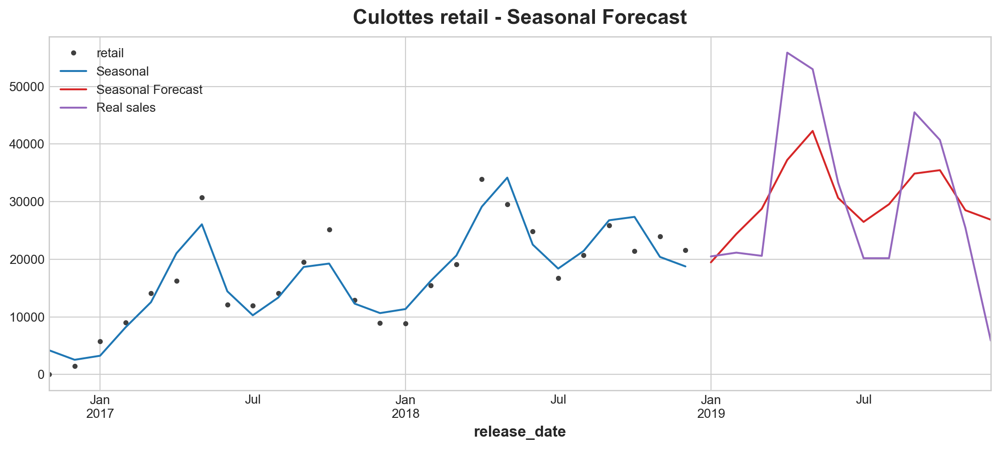

In [43]:
from statsmodels.tsa.deterministic import CalendarSeasonality, CalendarFourier, DeterministicProcess
X=train
data=train
index = pd.PeriodIndex(X.index, freq='M')
X.index = index

seasonality = CalendarSeasonality(freq='M', period='A')  # weekly seasonality
fourier = CalendarFourier(freq="M", order=25)  # 2 sin/cos pairs for "A"nnual seasonality

dp = DeterministicProcess(
    index=X.index,
    constant=True,               # dummy feature for bias (y-intercept)
    order=1,                     # trend (order 1 means linear)
    seasonal=True,               # weekly seasonality (indicators)
    additional_terms=[seasonality, fourier],  # annual seasonality (fourier)
    drop=True,                   # drop terms to avoid collinearity
)

X = dp.in_sample()  # create features for dates in tunnel.index
y = data.retail
model = LinearRegression(fit_intercept=False)
_ = model.fit(X, y)

y_pred = pd.Series(model.predict(X), index=y.index)
X_fore = dp.out_of_sample(steps=12)
y_fore = pd.Series(model.predict(X_fore), index=X_fore.index)

ax = y.plot(color='0.25', style='.', title="Culottes retail - Seasonal Forecast")
ax = y_pred.plot(ax=ax, label="Seasonal")
ax = y_fore.plot(ax=ax, label="Seasonal Forecast", color='C3')
ax = test.retail.plot(ax=ax, label="Real sales", color='C4')
_ = ax.legend()


In [44]:
test1 = test.reset_index(drop=True)
test1['fore'] = y_fore.reset_index(drop=True)
test1['predicted_restock']=test1['retail']-test1['fore']
test1.index=test.index
test1

,retail,restock,price,fore,predicted_restock
release_date,,,,,
2019-01-31,20497,8611,0.076995,19461.250000,1035.750000
2019-02-28,21148,9598,0.076764,24384.750000,-3236.750000
2019-03-31,20593,7533,0.080517,28756.750000,-8163.750000
2019-04-30,55862,38226,0.077395,37238.250000,18623.750000
2019-05-31,52987,25059,0.076054,42272.250000,10714.750000
2019-06-30,33303,12992,0.075509,30645.750000,2657.250000
2019-07-31,20186,6878,0.072572,26484.250000,-6298.250000
2019-08-31,20186,12615,0.078415,29550.750000,-9364.750000
2019-09-30,45504,23442,0.074880,34870.250000,10633.750000


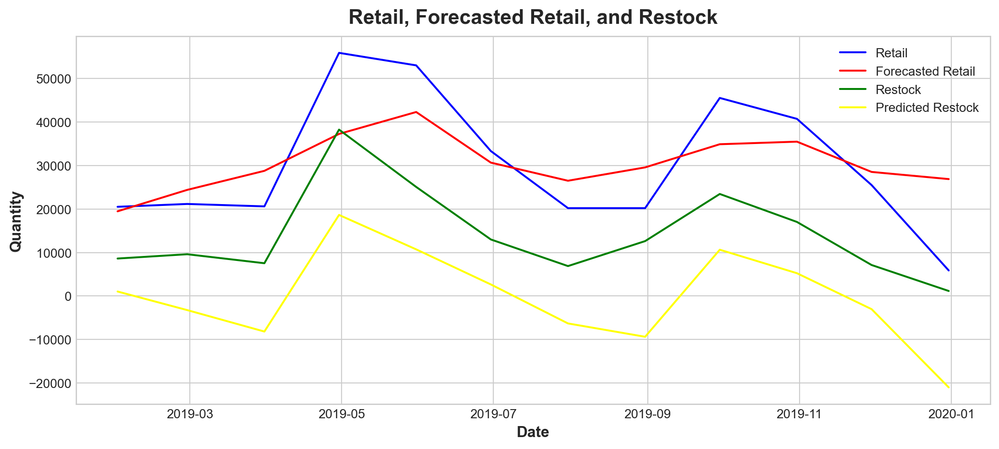

In [45]:
import matplotlib.pyplot as plt

# Create a figure and axis object
fig, ax = plt.subplots()

# Plot retail, fore, and restock as lines
ax.plot(test.index, test1["retail"], color='blue', label='Retail')
ax.plot(test.index, test1["fore"], color='red', label='Forecasted Retail')
ax.plot(test.index, test1["restock"], color='green', label='Restock')
ax.plot(test.index, test1["predicted_restock"], color='yellow', label='Predicted Restock')
        
# Add title and axis labels
ax.set_title('Retail, Forecasted Retail, and Restock')
ax.set_xlabel('Date')
ax.set_ylabel('Quantity')

# Add legend
ax.legend()

# Show the plot
plt.show()


On peut voir que dans la plupart du temps, le restock predicted par cette modèle permet d'améliorer le restock et en faire moins.Ce qui permet de réduire le coût de 2eme production et de transportation.

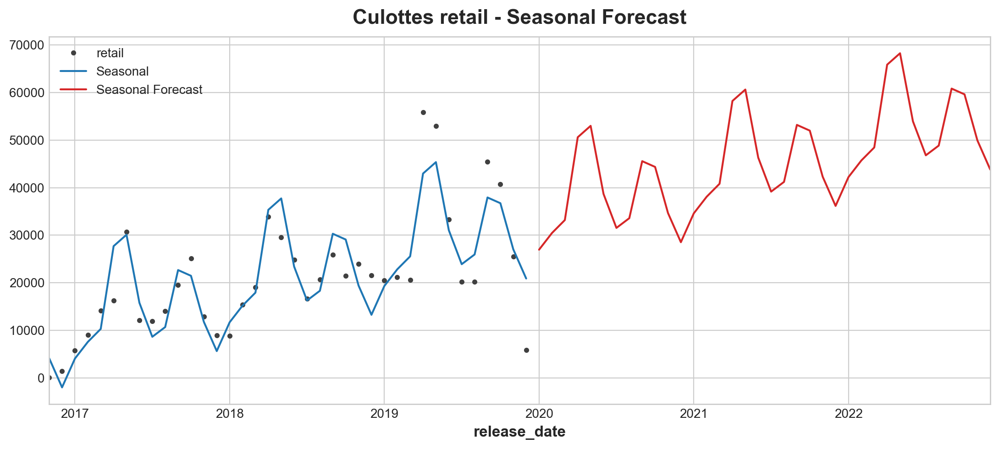

In [47]:
from statsmodels.tsa.deterministic import CalendarSeasonality, CalendarFourier, DeterministicProcess
X=monthly_data
data=monthly_data
index = pd.PeriodIndex(X.index, freq='M')
X.index = index

seasonality = CalendarSeasonality(freq='M', period='A')  # weekly seasonality
fourier = CalendarFourier(freq="M", order=25)  # 2 sin/cos pairs for "A"nnual seasonality

dp = DeterministicProcess(
    index=X.index,
    constant=True,               # dummy feature for bias (y-intercept)
    order=1,                     # trend (order 1 means linear)
    seasonal=True,               # weekly seasonality (indicators)
    additional_terms=[seasonality, fourier],  # annual seasonality (fourier)
    drop=True,                   # drop terms to avoid collinearity
)

X = dp.in_sample()  # create features for dates in tunnel.index
y = data.retail
model = LinearRegression(fit_intercept=False)
_ = model.fit(X, y)

y_pred = pd.Series(model.predict(X), index=y.index)
X_fore = dp.out_of_sample(steps=36)
y_fore = pd.Series(model.predict(X_fore), index=X_fore.index)

ax = y.plot(color='0.25', style='.', title="Culottes retail - Seasonal Forecast")
ax = y_pred.plot(ax=ax, label="Seasonal")
ax = y_fore.plot(ax=ax, label="Seasonal Forecast", color='C3')

_ = ax.legend()


In [1196]:
df1

,release_date,retail,restock,category,price
0,2016-11-28,36,22,long sleeve,0.054944
1,2016-11-28,51,17,long sleeve,0.054944
2,2016-11-28,10,15,long sleeve,0.054944
3,2016-11-28,41,32,culottes,0.043951
4,2016-11-28,13,26,long sleeve,0.054944
...,...,...,...,...,...
106845,2019-12-30,51,12,medium coat,0.138405
106846,2019-12-30,10,12,medium coat,0.138405
106847,2019-12-30,108,15,medium coat,0.076843
106848,2019-12-30,105,1,culottes,0.043863


In [48]:
# Créer un DataFrame avec uniquement les données de la catégorie "long sleeve"
df1=merged_df[['release_date','retail','restock','category','price']]
long_sleeve_df = df1[df1["category"] == "long sleeve"]

long_sleeve_df = long_sleeve_df.groupby('release_date').agg({'retail': 'sum', 'restock': 'sum', 'price': 'mean'})
long_sleeve_df.head()

,retail,restock,price
release_date,,,
2016-11-28,238,153,0.054944
2016-12-05,2778,3169,0.056055
2016-12-12,878,788,0.064106
2016-12-19,347,281,0.103680
2016-12-26,257,123,0.106246


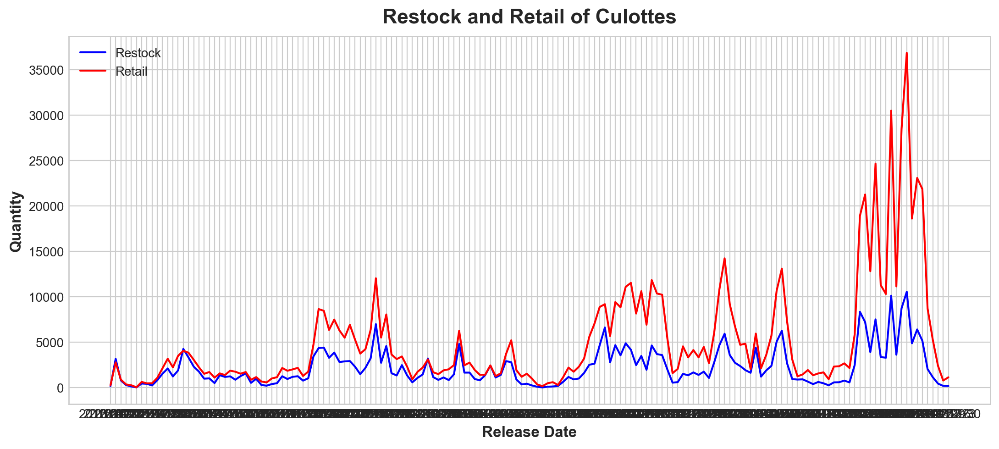

In [49]:
# Créer un DataFrame avec uniquement les données de la catégorie "culottes"

import matplotlib.pyplot as plt

# Create a figure and axis object
fig, ax = plt.subplots()

# Plot restock as a blue line
ax.plot(long_sleeve_df.index, long_sleeve_df["restock"], color='blue', label='Restock')

# Plot retail as a red line
ax.plot(long_sleeve_df.index, long_sleeve_df["retail"], color='red', label='Retail')

# Add title and axis labels
ax.set_title('Restock and Retail of Culottes')
ax.set_xlabel('Release Date')
ax.set_ylabel('Quantity')

# Add legend
ax.legend()

# Show the plot
plt.show()


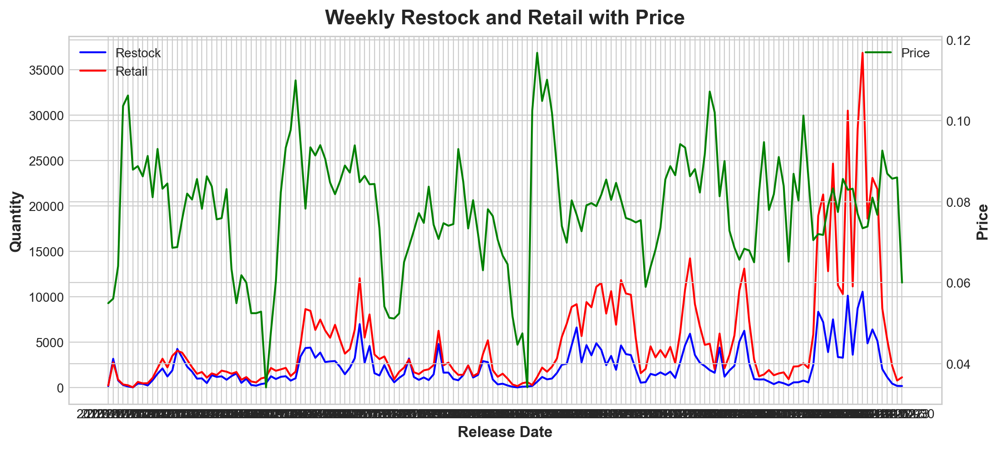

In [50]:
import pandas as pd
import matplotlib.pyplot as plt

# 按周分组
culotte_pre_weekly = long_sleeve_df

# 创建一个figure和一个axis对象
fig, ax = plt.subplots()

# 绘制“Restock”和“Retail”折线图
ax.plot(culotte_pre_weekly.index, culotte_pre_weekly["restock"], color='blue', label='Restock')
ax.plot(culotte_pre_weekly.index, culotte_pre_weekly["retail"], color='red', label='Retail')

# 创建第二个axis对象，共享x轴
ax2 = ax.twinx()

# 绘制“Price”折线图
ax2.plot(culotte_pre_weekly.index, culotte_pre_weekly["price"], color='green', label='Price')

# 添加标题和轴标签
ax.set_title('Weekly Restock and Retail with Price')
ax.set_xlabel('Release Date')
ax.set_ylabel('Quantity')
ax2.set_ylabel('Price')

# 添加图例
ax.legend(loc='upper left')
ax2.legend(loc='upper right')

# 显示图形
plt.show()


In [1205]:
print('retail vs restock',long_sleeve_df['retail'].corr(long_sleeve_df['restock']))
print('retail vs price',long_sleeve_df['retail'].corr(long_sleeve_df['price']))
#Le prix a une corrélation important avec retail contraire à culottes

retail vs restock 0.9213742160700634
retail vs price 0.06731749002927902


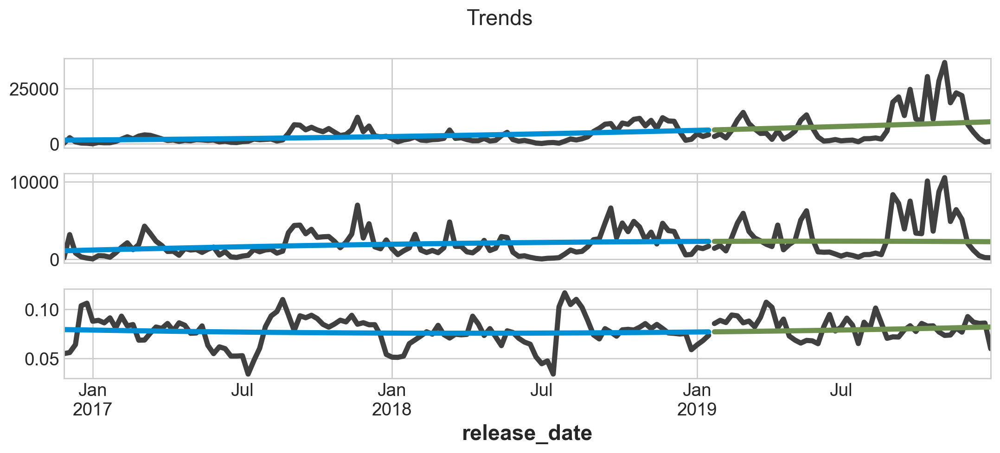

In [1209]:
from sklearn.model_selection import train_test_split

y = long_sleeve_df
# Create trend features
dp = DeterministicProcess(
    index=y.index,  # dates from the training data
    constant=True,  # the intercept
    order=2,        # quadratic trend
    drop=True,      # drop terms to avoid collinearity
)
X = dp.in_sample()  # features for the training data

# Test on the years 2016-2019. It will be easier for us later if we
# split the date index instead of the dataframe directly.
idx_train, idx_test = train_test_split(
    y.index, test_size=0.3, shuffle=False,
)
X_train, X_test = X.loc[idx_train, :], X.loc[idx_test, :]
y_train, y_test = y.loc[idx_train], y.loc[idx_test]

# Fit trend model
model = LinearRegression(fit_intercept=False)
model.fit(X_train, y_train)

# Make predictions
y_fit = pd.DataFrame(
    model.predict(X_train),
    index=y_train.index,
    columns=y_train.columns,
)
y_pred = pd.DataFrame(
    model.predict(X_test),
    index=y_test.index,
    columns=y_test.columns,
)

# Plot
axs = y_train.plot(color='0.25', subplots=True, sharex=True)
axs = y_test.plot(color='0.25', subplots=True, sharex=True, ax=axs)
axs = y_fit.plot(color='C0', subplots=True, sharex=True, ax=axs)
axs = y_pred.plot(color='C3', subplots=True, sharex=True, ax=axs)
for ax in axs: ax.legend([])
_ = plt.suptitle("Trends")

In [77]:
import pandas as pd

# Assuming your dataframe is called df, and the release_date column is already set as the index
#long_sleeve_df.index = pd.to_datetime(long_sleeve_df.index)
long_sleeve_df.index=long_sleeve_df.index.to_timestamp()
# Resample by end of each month, and calculate mean of price, and sum of retail and restock
df_monthly = long_sleeve_df.resample('M').agg({'price': 'mean', 'retail': 'sum', 'restock': 'sum'})

# Print the resulting dataframe
df_monthly.head()


,price,retail,restock
release_date,,,
2016-11-30,0.054944,238,153
2016-12-31,0.082522,4260,4361
2017-01-31,0.087086,2683,1942
2017-02-28,0.082349,11040,6749
2017-03-31,0.076783,13197,11643


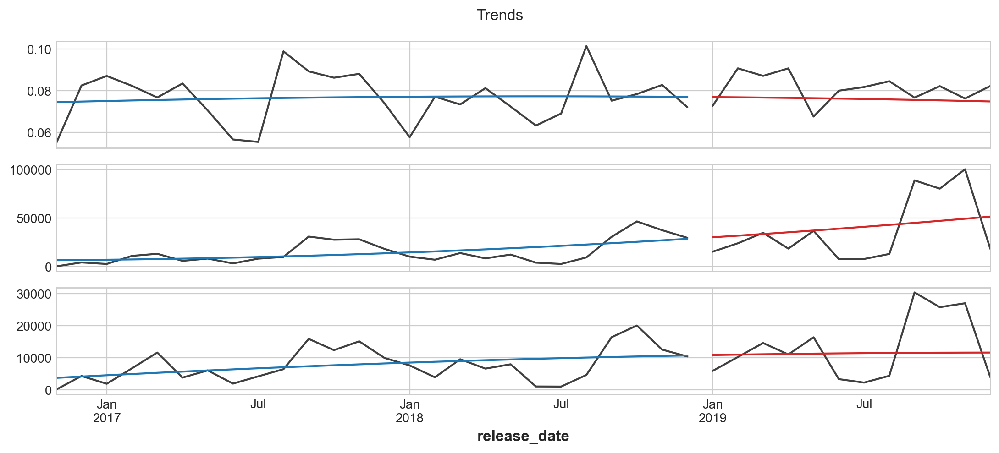

In [78]:
from sklearn.model_selection import train_test_split

y = df_monthly 
# Create trend features
dp = DeterministicProcess(
    index=y.index,  # dates from the training data
    constant=True,  # the intercept
    order=2,        # quadratic trend
    drop=True,      # drop terms to avoid collinearity
)
X = dp.in_sample()  # features for the training data

# Test on the years 2016-2019. It will be easier for us later if we
# split the date index instead of the dataframe directly.
idx_train, idx_test = train_test_split(
    y.index, test_size=0.3, shuffle=False,
)
X_train, X_test = X.loc[idx_train, :], X.loc[idx_test, :]
y_train, y_test = y.loc[idx_train], y.loc[idx_test]

# Fit trend model
model = LinearRegression(fit_intercept=False)
model.fit(X_train, y_train)

# Make predictions
y_fit = pd.DataFrame(
    model.predict(X_train),
    index=y_train.index,
    columns=y_train.columns,
)
y_pred = pd.DataFrame(
    model.predict(X_test),
    index=y_test.index,
    columns=y_test.columns,
)

# Plot
axs = y_train.plot(color='0.25', subplots=True, sharex=True)
axs = y_test.plot(color='0.25', subplots=True, sharex=True, ax=axs)
axs = y_fit.plot(color='C0', subplots=True, sharex=True, ax=axs)
axs = y_pred.plot(color='C3', subplots=True, sharex=True, ax=axs)
for ax in axs: ax.legend([])
_ = plt.suptitle("Trends")

In [72]:
X_train, X_test = X.loc[idx_train, :], X.loc[idx_test, :]
y_train, y_test = y.loc[idx_train], y.loc[idx_test]

In [73]:
import xgboost as xgb
from sklearn.preprocessing import StandardScaler
df5=df_monthly 

df5 = df5.reset_index(drop=True)

X = df5.drop(columns=['retail'])
list=X.columns
y = df5['retail']

scaler = StandardScaler()
X = scaler.fit_transform(X)

model = xgb.XGBRegressor()
model.fit(X, y)
importance = model.feature_importances_

importance_df = pd.DataFrame({'feature': list, 'importance': importance})
importance_df = importance_df.sort_values(by='importance', ascending=False)
print(importance_df.round(2))

   feature  importance
1  restock        0.99
0    price        0.01


Le prix n'est pas assez important pour la prédiction

<Figure size 1100x600 with 0 Axes>

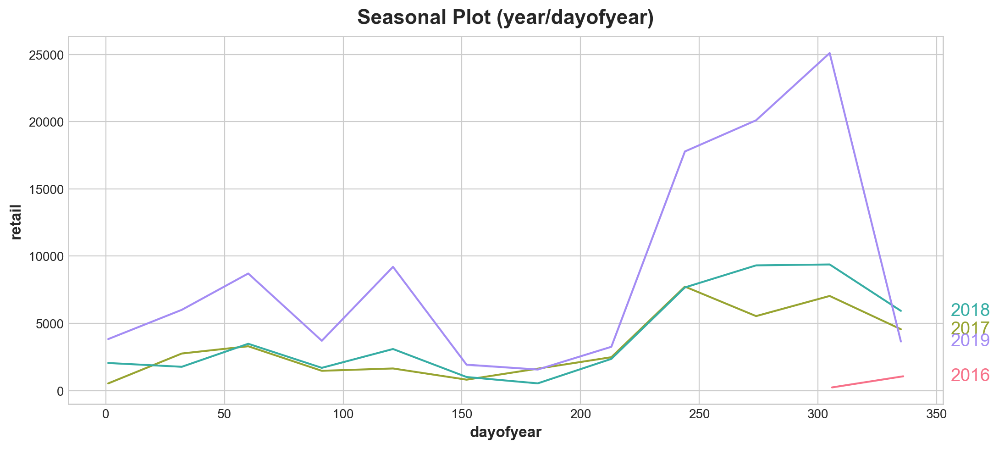

In [79]:
data= long_sleeve_df
X = data.copy()
X.index = pd.to_datetime(data.index)

# days within a week
X["week"] = X.index.week  # the seasonal period (period)
X = data.copy()
X.index = pd.to_datetime(data.index)
# days within a week
X["day"] = X.index.dayofweek  # the x-axis (freq)
X["week"] = X.index.week  # the seasonal period (period)
X["month"] = X.index.month  # the seasonal period (period)
# days within a year
X["dayofyear"] = X.index.dayofyear
X["year"] = X.index.year
fig = plt.figure(figsize=(11, 6))
seasonal_plot(X, y="retail", period="year", freq="dayofyear", ax=None)
plt.show()

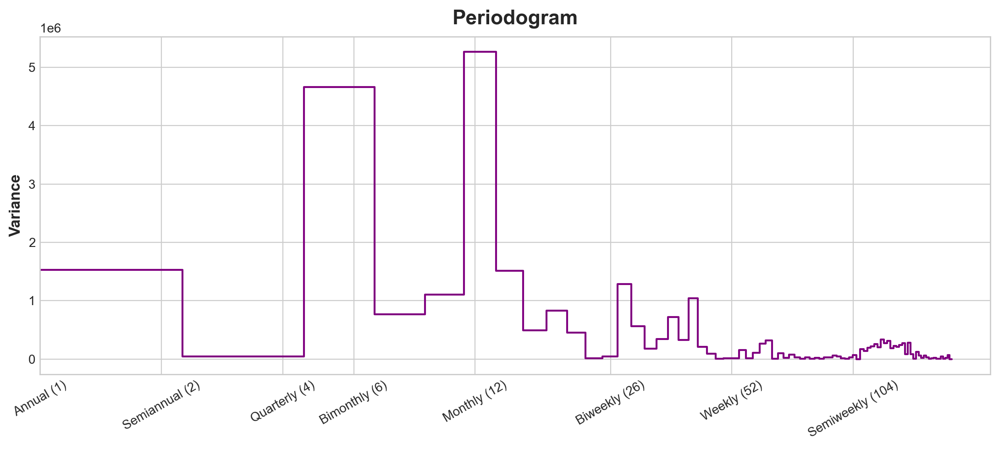

In [80]:
plot_periodogram(X.retail);

In [81]:
train_size = int(len(df_monthly) * 0.7)
train, test = df_monthly.iloc[:train_size,:], df_monthly.iloc[train_size:,:]

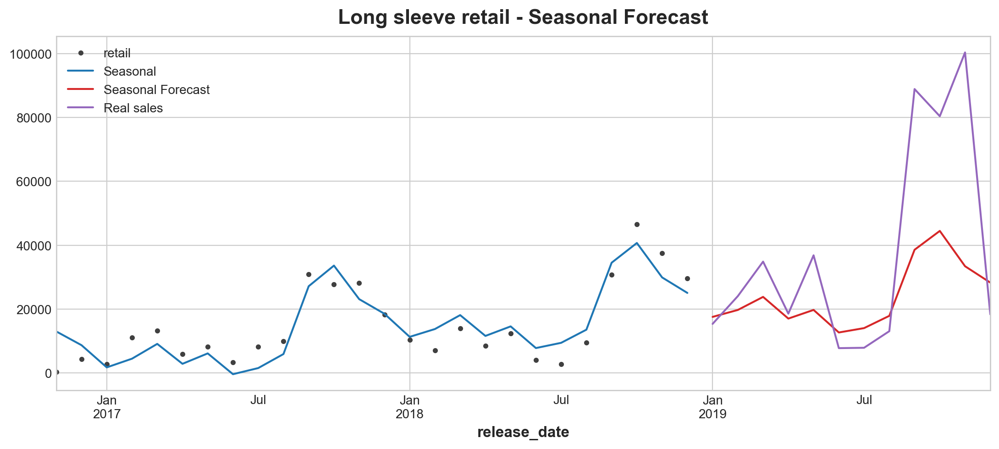

In [82]:
from statsmodels.tsa.deterministic import CalendarSeasonality, CalendarFourier, DeterministicProcess
X=train
data=train
index = pd.PeriodIndex(X.index, freq='M')
X.index = index

seasonality = CalendarSeasonality(freq='M', period='A')  # weekly seasonality
fourier = CalendarFourier(freq="M", order=25)  # 2 sin/cos pairs for "A"nnual seasonality

dp = DeterministicProcess(
    index=X.index,
    constant=True,               # dummy feature for bias (y-intercept)
    order=2,                     # trend (order 1 means linear)
    seasonal=True,               # weekly seasonality (indicators)
    additional_terms=[seasonality, fourier],  # annual seasonality (fourier)
    drop=True,                   # drop terms to avoid collinearity
)

X = dp.in_sample()  # create features for dates in tunnel.index
y = data.retail
model = LinearRegression(fit_intercept=False)
_ = model.fit(X, y)

y_pred = pd.Series(model.predict(X), index=y.index)
X_fore = dp.out_of_sample(steps=12)
y_fore = pd.Series(model.predict(X_fore), index=X_fore.index)

ax = y.plot(color='0.25', style='.', title="Long sleeve retail - Seasonal Forecast")
ax = y_pred.plot(ax=ax, label="Seasonal")
ax = y_fore.plot(ax=ax, label="Seasonal Forecast", color='C3')
ax = test.retail.plot(ax=ax, label="Real sales", color='C4')
_ = ax.legend()


In [83]:
test1 = test.reset_index(drop=True)
test1['fore'] = y_fore.reset_index(drop=True)
test1['predicted_restock']=test1['retail']-test1['fore']
test1.index=test.index
test1

,price,retail,restock,fore,predicted_restock
release_date,,,,,
2019-01-31,0.072791,15331,5935,17520.514312,-2189.514312
2019-02-28,0.090742,24032,10255,19695.399354,4336.600646
2019-03-31,0.087111,34839,14609,23785.284395,11053.715605
2019-04-30,0.090714,18541,11050,16988.169437,1552.830563
2019-05-31,0.067682,36816,16391,19700.054478,17115.945522
2019-06-30,0.080033,7720,3389,12633.439520,-4913.439520
2019-07-31,0.081782,7839,2307,13999.824561,-6160.824561
2019-08-31,0.084564,13038,4425,17843.709603,-4805.709603
2019-09-30,0.076724,88918,30342,38554.594645,50363.405355


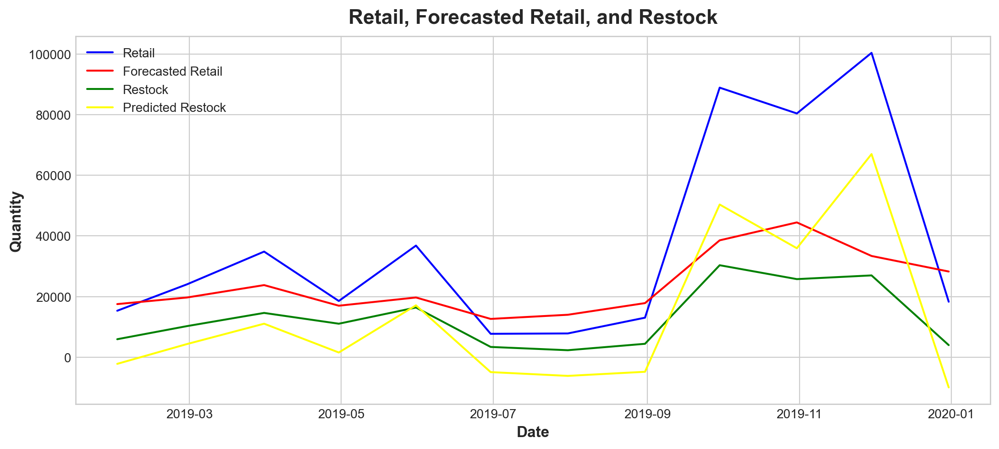

In [84]:
import matplotlib.pyplot as plt

# Create a figure and axis object
fig, ax = plt.subplots()

# Plot retail, fore, and restock as lines
ax.plot(test.index, test1["retail"], color='blue', label='Retail')
ax.plot(test.index, test1["fore"], color='red', label='Forecasted Retail')
ax.plot(test.index, test1["restock"], color='green', label='Restock')
ax.plot(test.index, test1["predicted_restock"], color='yellow', label='Predicted Restock')
        
# Add title and axis labels
ax.set_title('Retail, Forecasted Retail, and Restock')
ax.set_xlabel('Date')
ax.set_ylabel('Quantity')

# Add legend
ax.legend()

# Show the plot
plt.show()


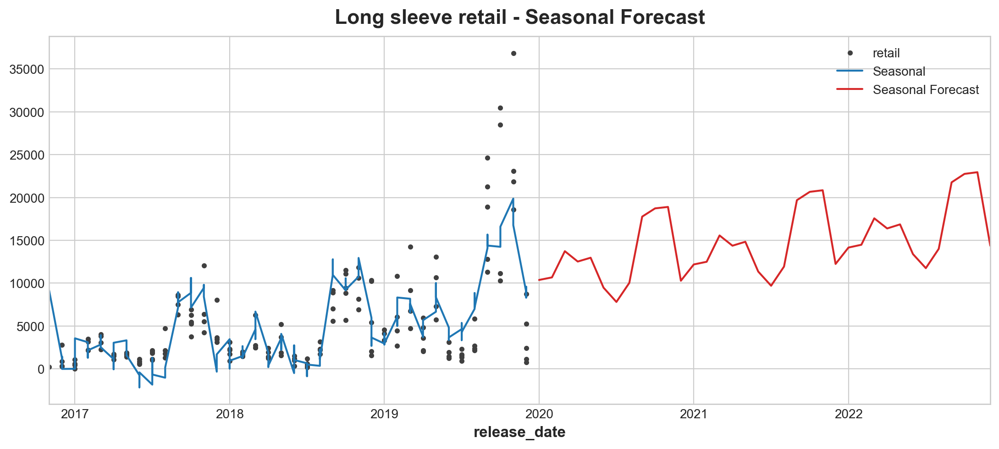

In [85]:
from statsmodels.tsa.deterministic import CalendarSeasonality, CalendarFourier, DeterministicProcess
X=long_sleeve_df
data=long_sleeve_df
index = pd.PeriodIndex(X.index, freq='M')
X.index = index

seasonality = CalendarSeasonality(freq='M', period='A')  # weekly seasonality
fourier = CalendarFourier(freq="M", order=25)  # 2 sin/cos pairs for "A"nnual seasonality

dp = DeterministicProcess(
    index=X.index,
    constant=True,               # dummy feature for bias (y-intercept)
    order=2,                     # trend (order 1 means linear)
    seasonal=True,               # weekly seasonality (indicators)
    additional_terms=[seasonality, fourier],  # annual seasonality (fourier)
    drop=True,                   # drop terms to avoid collinearity
)

X = dp.in_sample()  # create features for dates in tunnel.index
y = data.retail
model = LinearRegression(fit_intercept=False)
_ = model.fit(X, y)

y_pred = pd.Series(model.predict(X), index=y.index)
X_fore = dp.out_of_sample(steps=36)
y_fore = pd.Series(model.predict(X_fore), index=X_fore.index)

ax = y.plot(color='0.25', style='.', title="Long sleeve retail - Seasonal Forecast")
ax = y_pred.plot(ax=ax, label="Seasonal")
ax = y_fore.plot(ax=ax, label="Seasonal Forecast", color='C3')

_ = ax.legend()
